# Data Aggregation

In [2]:
import os
import json
import pandas as pd

folder_path = "/Users/YizeLu/Desktop/discrete_opt_for_smart_city/final/ORIE-5213-Spring2023/Bike sharing/Dataset"
all_trips = []

for day_idx, fname in enumerate(sorted(os.listdir(folder_path))):
    if fname.endswith('.json') and fname.startswith('simu0'):
        with open(os.path.join(folder_path, fname)) as f:
            trips = json.load(f)
            for trip in trips:
                all_trips.append({
                    'day': day_idx-1,
                    'time_departure': trip[0],
                    'station_departure': trip[1],
                    'time_arrival': trip[2],
                    'station_arrival': trip[3]
                })

df = pd.DataFrame(all_trips)
df


,day,time_departure,station_departure,time_arrival,station_arrival
0,1,4.0,1.0,22.0,11.0
1,1,15.0,1.0,37.0,18.0
2,1,19.0,12.0,45.0,8.0
3,1,48.0,11.0,72.0,5.0
4,1,50.0,22.0,73.0,27.0
...,...,...,...,...,...
732534,500,1431.0,16.0,15.0,10.0
732535,500,1434.0,15.0,18.0,14.0
732536,500,1437.0,8.0,2.0,0.0
732537,500,1437.0,8.0,24.0,1.0


In [3]:
# ----- Chunk 0 (改)：从原始 trips 表构造完整的 demand DataFrame -----
import pandas as pd
from itertools import product

# 假设原始骑行记录叫 df，columns=['day','time_departure','station_departure','time_arrival','station_arrival']

# 1) 拆出 departures 和 arrivals
departures = (
    df[['day','time_departure','station_departure']]
    .rename(columns={'time_departure':'time','station_departure':'station'})
)
departures['departure_count'] = 1

arrivals = (
    df[['day','time_arrival','station_arrival']]
    .rename(columns={'time_arrival':'time','station_arrival':'station'})
)
arrivals['arrival_count'] = 1

# 2) 合并并将 NaN 填为 0
events = pd.concat([departures, arrivals], ignore_index=True)
events[['departure_count','arrival_count']] = events[['departure_count','arrival_count']].fillna(0)

# 3) 计算半小时 interval（0–47）
events['interval_30min'] = (events['time'] // 30).astype(int)

# 4) 聚合出已有事件的组合
agg = (
    events
    .groupby(['day','interval_30min','station'])[['departure_count','arrival_count']]
    .sum()
    .reset_index()
)
agg['net_growth'] = agg['arrival_count'] - agg['departure_count']

# 5) 补全所有 day × interval × station 组合，缺失的行填 0
all_days      = df['day'].unique()
all_intervals = list(range(48))
all_stations  = sorted(pd.unique(
    pd.concat([
        df['station_departure'], 
        df['station_arrival']
    ])
))
# 构造完整索引
idx = pd.MultiIndex.from_product(
    [all_days, all_intervals, all_stations],
    names=['day','interval_30min','station']
)
# reindex 填充缺失组合
df_demand = (
    agg
    .set_index(['day','interval_30min','station'])
    .reindex(idx, fill_value=0)
    .reset_index()
)

# 6) 最终 df_demand 包含
#    day, interval_30min, station, departure_count, arrival_count, net_growth
# 行数 = len(all_days) * 48 * len(all_stations)
print(df_demand.shape)  # 应该是 (500*48*30, 6)
df_demand.head()


(720000, 6)


,day,interval_30min,station,departure_count,arrival_count,net_growth
0,1,0,0.0,0.0,0.0,0.0
1,1,0,1.0,2.0,0.0,-2.0
2,1,0,2.0,0.0,0.0,0.0
3,1,0,3.0,0.0,0.0,0.0
4,1,0,4.0,0.0,0.0,0.0


In [4]:
df_demand

,day,interval_30min,station,departure_count,arrival_count,net_growth
0,1,0,0.0,0.0,0.0,0.0
1,1,0,1.0,2.0,0.0,-2.0
2,1,0,2.0,0.0,0.0,0.0
3,1,0,3.0,0.0,0.0,0.0
4,1,0,4.0,0.0,0.0,0.0
...,...,...,...,...,...,...
719995,500,47,25.0,0.0,0.0,0.0
719996,500,47,26.0,1.0,1.0,0.0
719997,500,47,27.0,1.0,0.0,-1.0
719998,500,47,28.0,0.0,0.0,0.0


In [5]:
# import pandas as pd

# departures = df[['day', 'time_departure', 'station_departure']].copy()
# departures.columns = ['day', 'time', 'station']
# departures['change'] = -1

# arrivals = df[['day', 'time_arrival', 'station_arrival']].copy()
# arrivals.columns = ['day', 'time', 'station']
# arrivals['change'] = +1

# events = pd.concat([departures, arrivals], ignore_index=True)
# events['interval_30min'] = (events['time'] // 30).astype(int)

# demand = (
#     events.groupby(['day', 'interval_30min', 'station'])['change']
#     .sum()
#     .reset_index()
# )

# demand_ts = demand.pivot_table(index=['day', 'interval_30min'], columns='station', values='change').fillna(0)
# demand_ts = demand_ts.sort_index()
# interval_labels = {i: f"{i // 2:02d}:{'00' if i % 2 == 0 else '30'}" for i in range(48)}
# demand_ts.index = demand_ts.index.set_levels(
#     demand_ts.index.levels[1].map(interval_labels),
#     level=1
# )

# demand_ts.columns = demand_ts.columns + 1
# demand_ts

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

<Figure size 1500x1000 with 0 Axes>

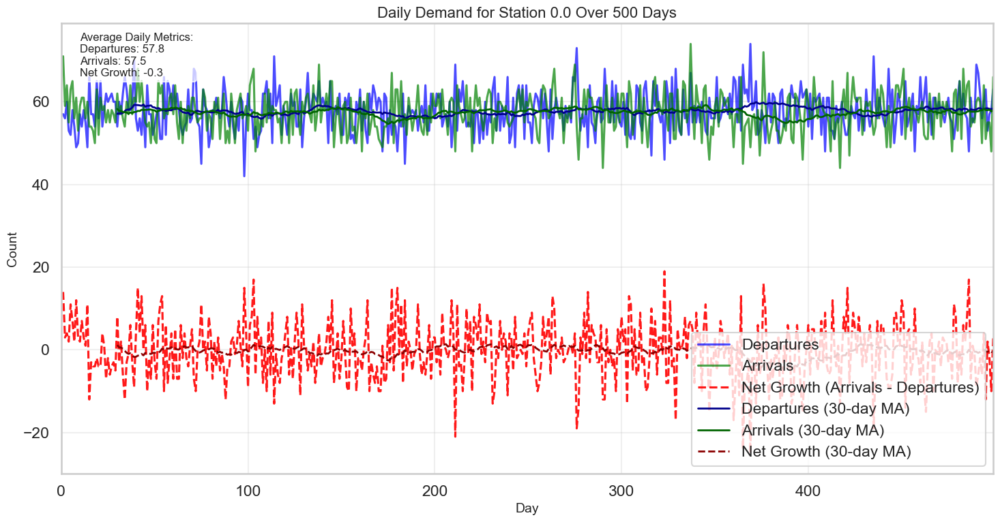

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

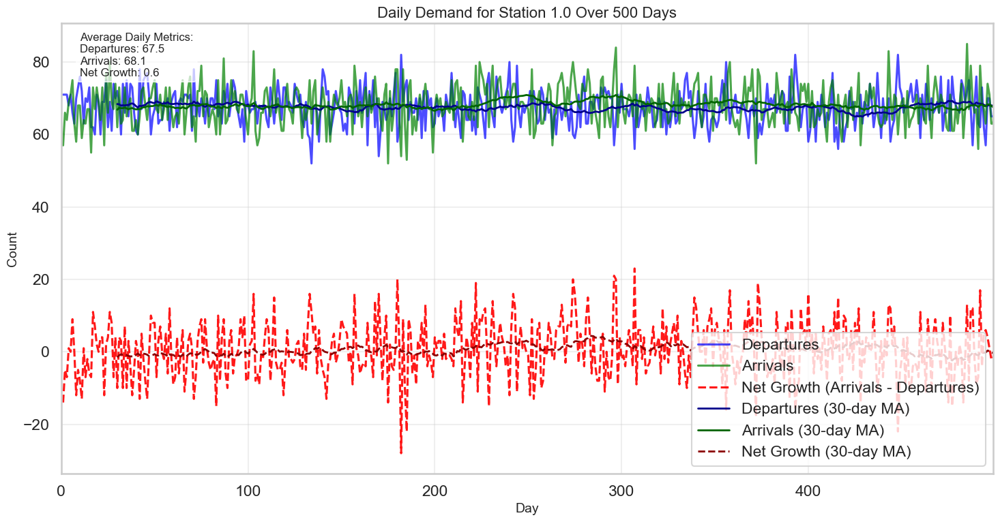

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

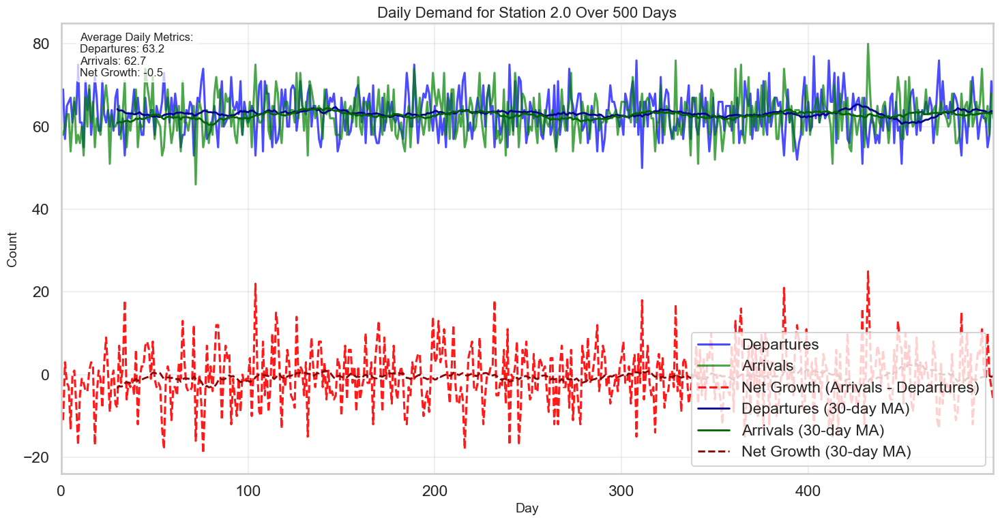

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

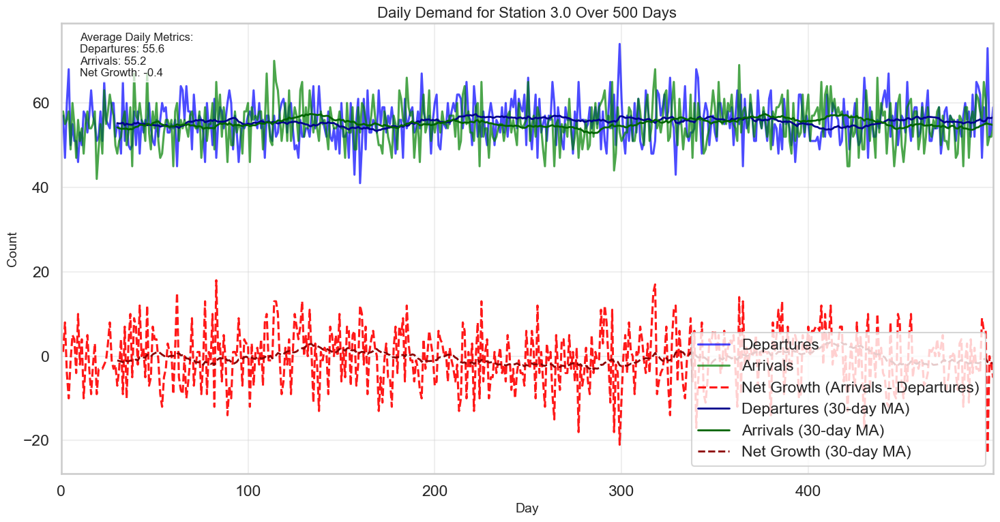

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

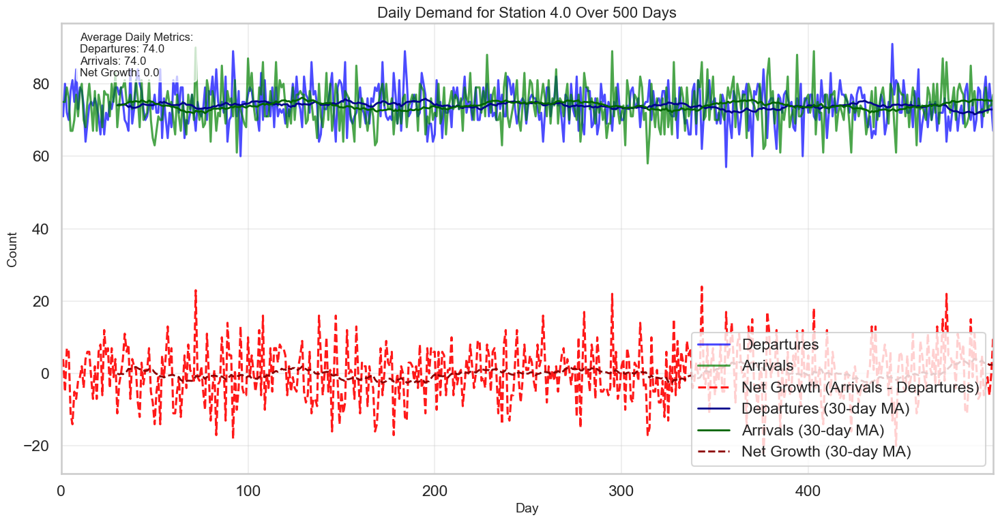

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

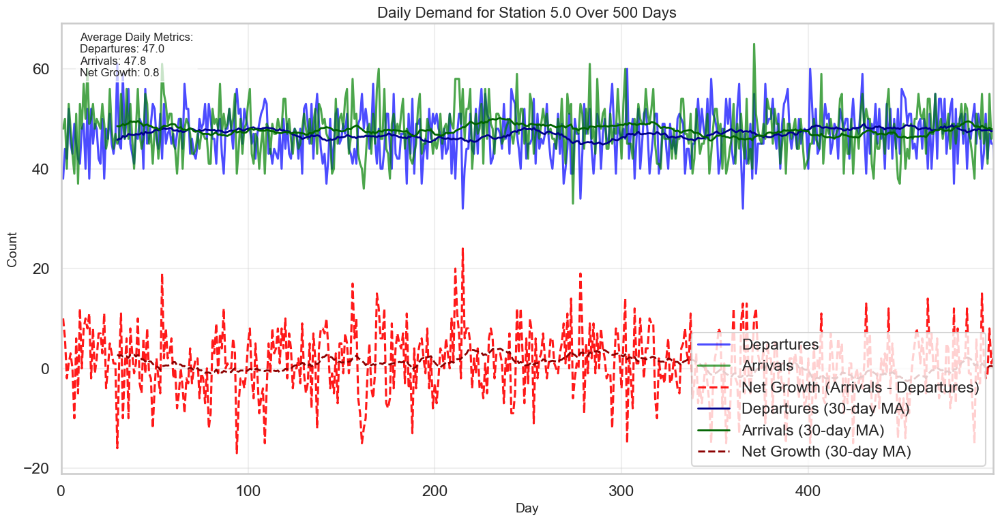

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

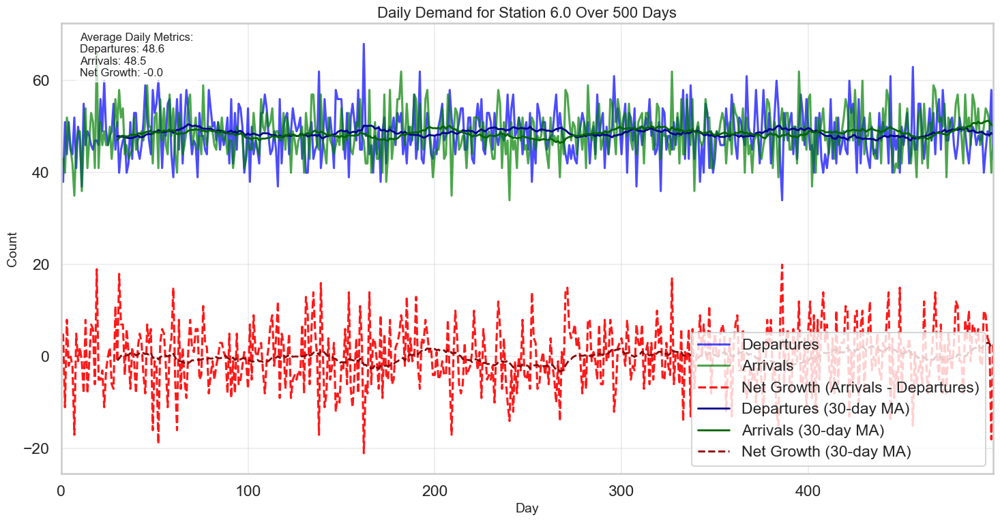

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

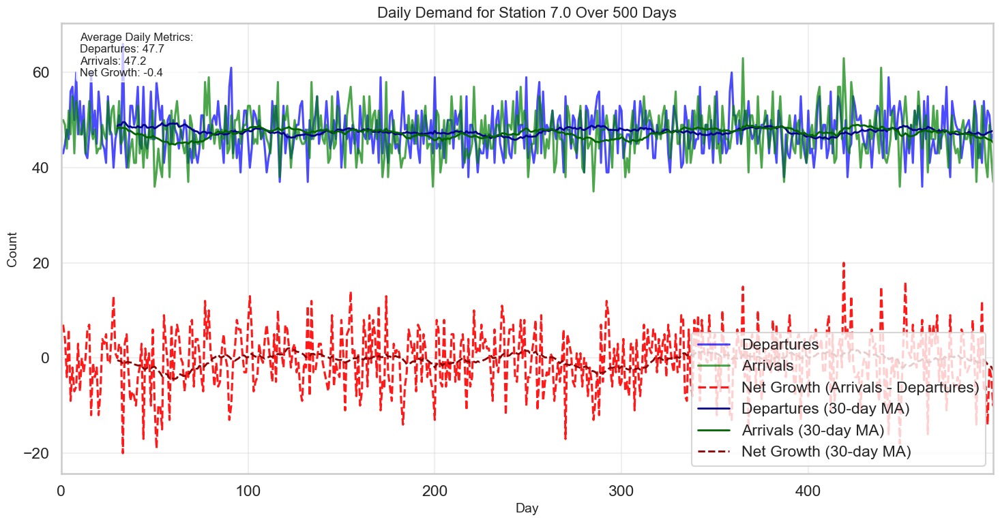

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

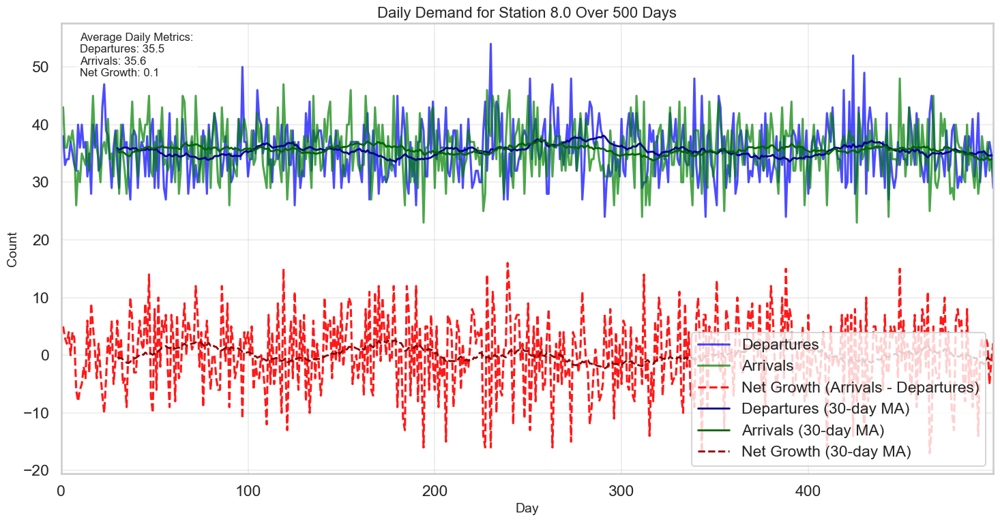

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

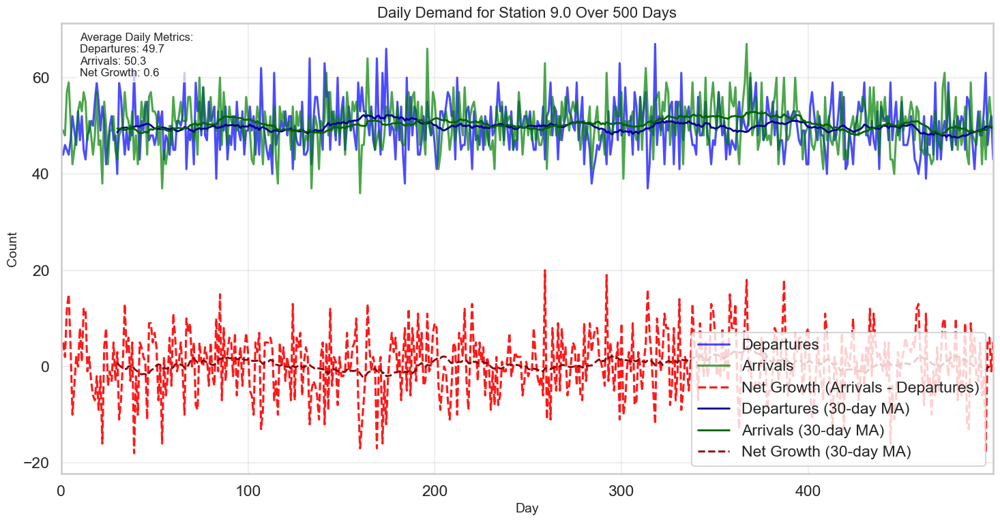

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

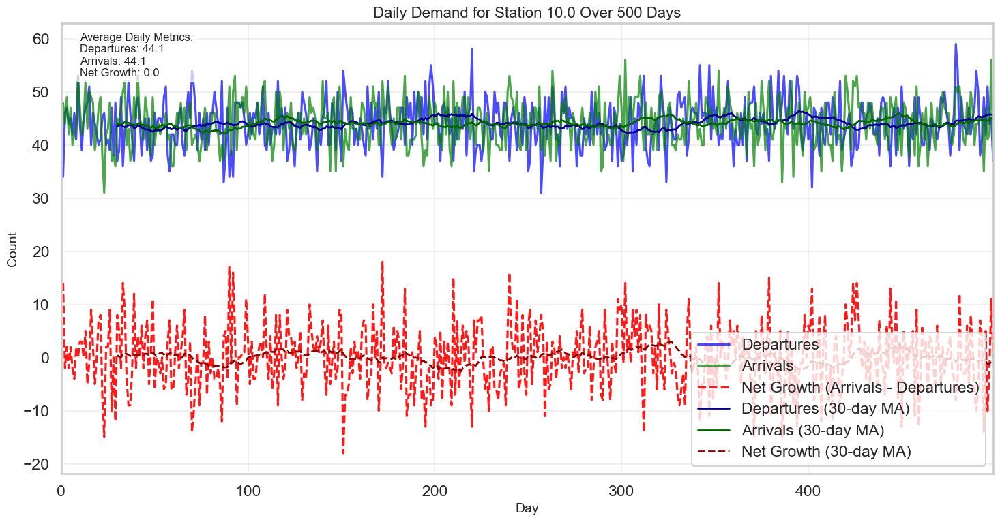

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

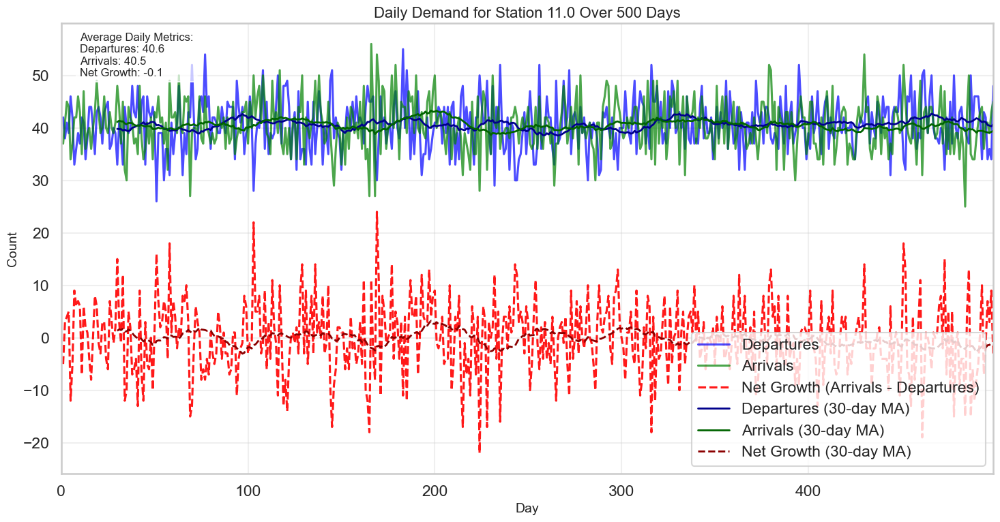

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

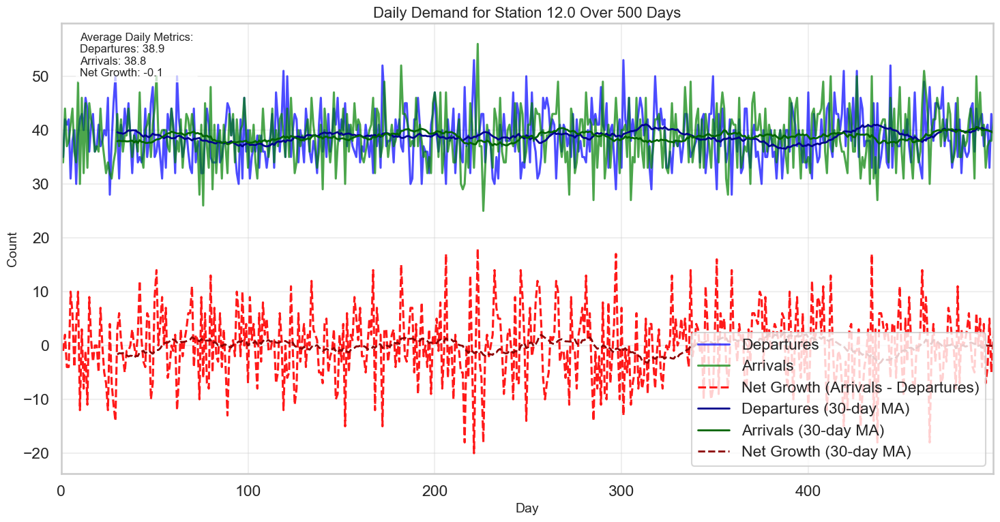

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

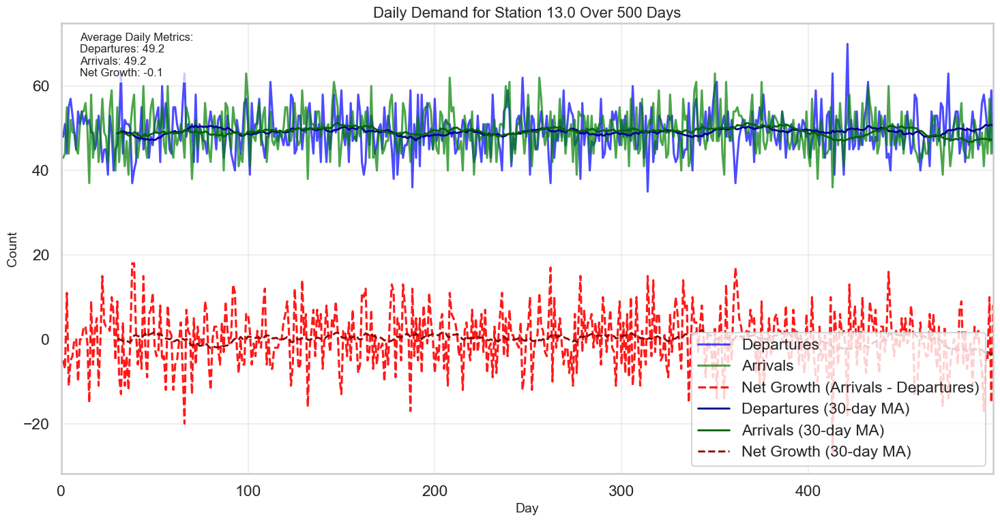

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

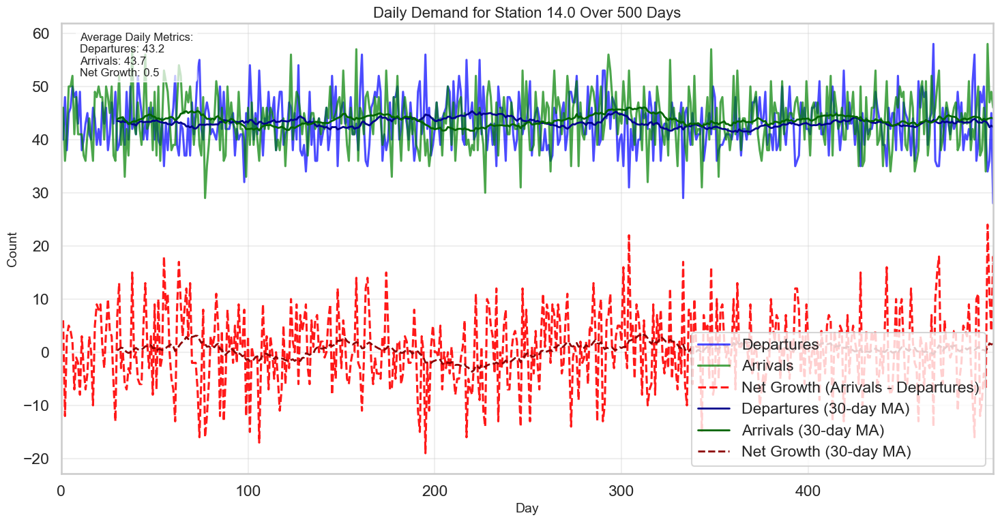

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

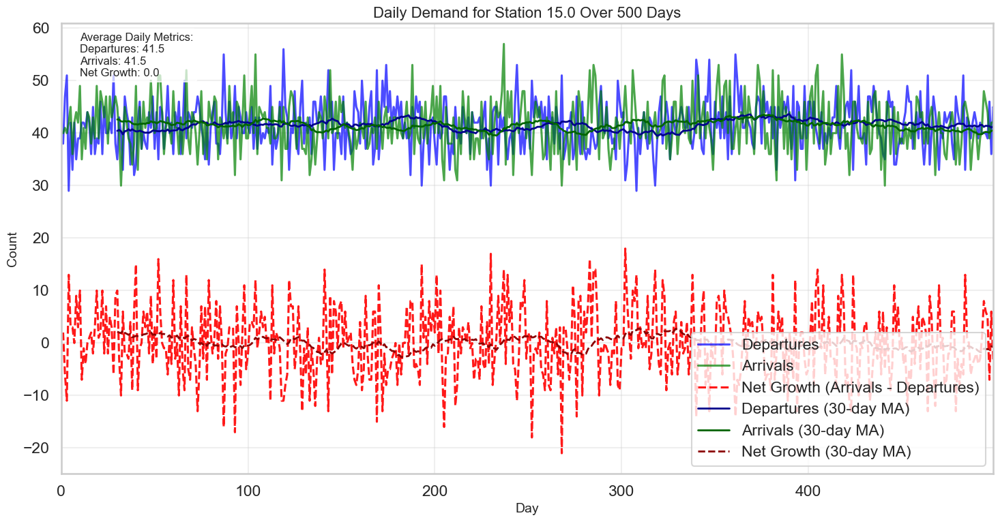

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

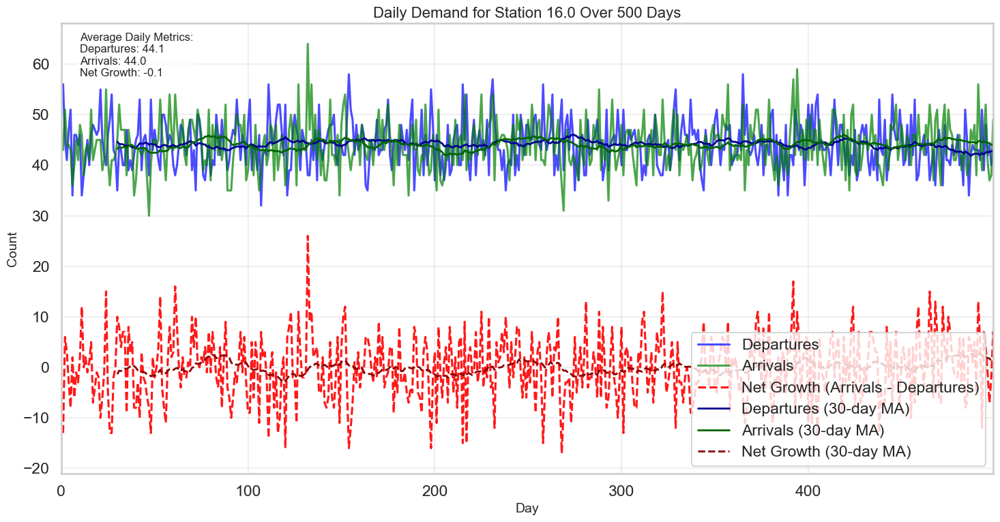

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

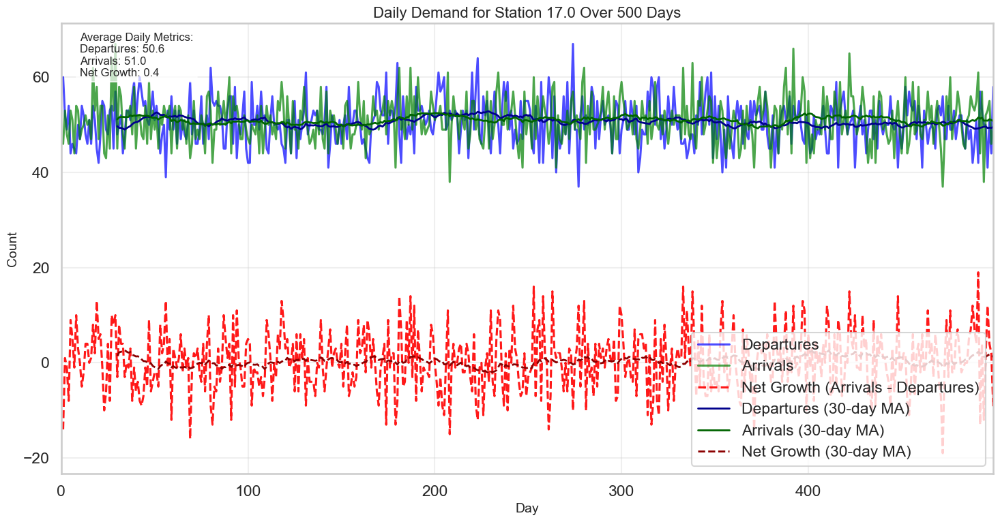

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

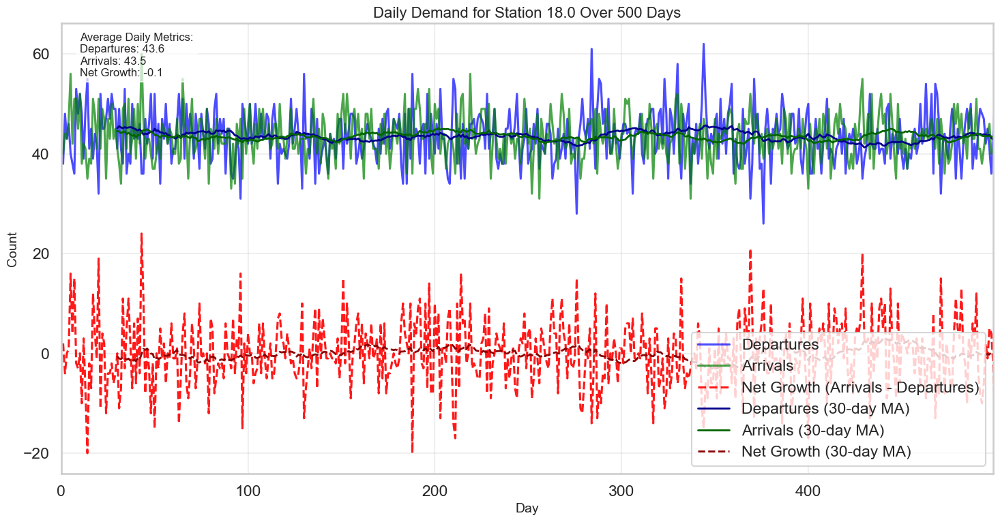

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

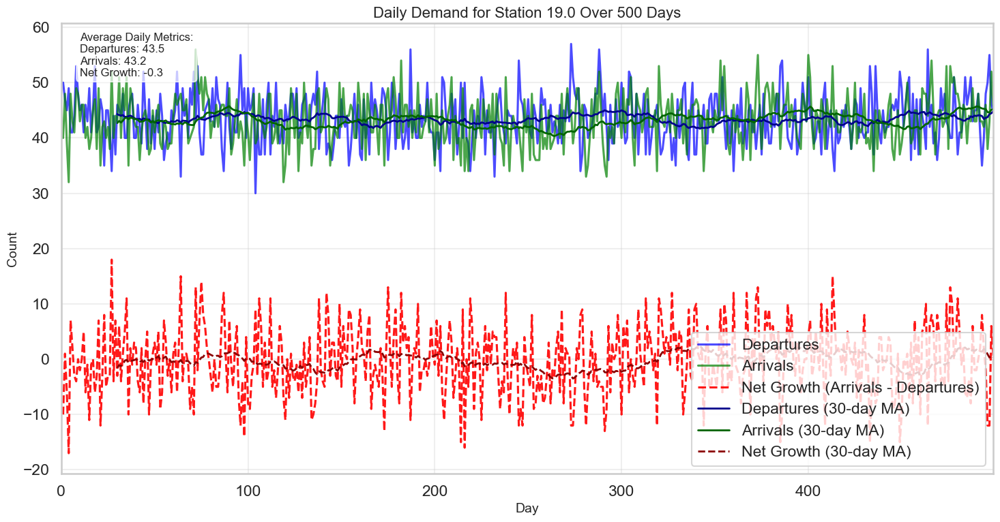

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

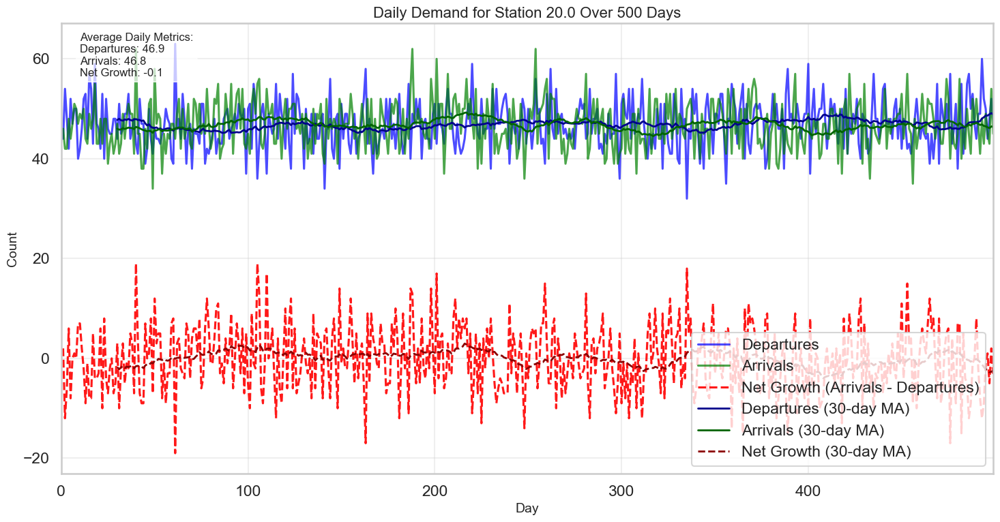

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

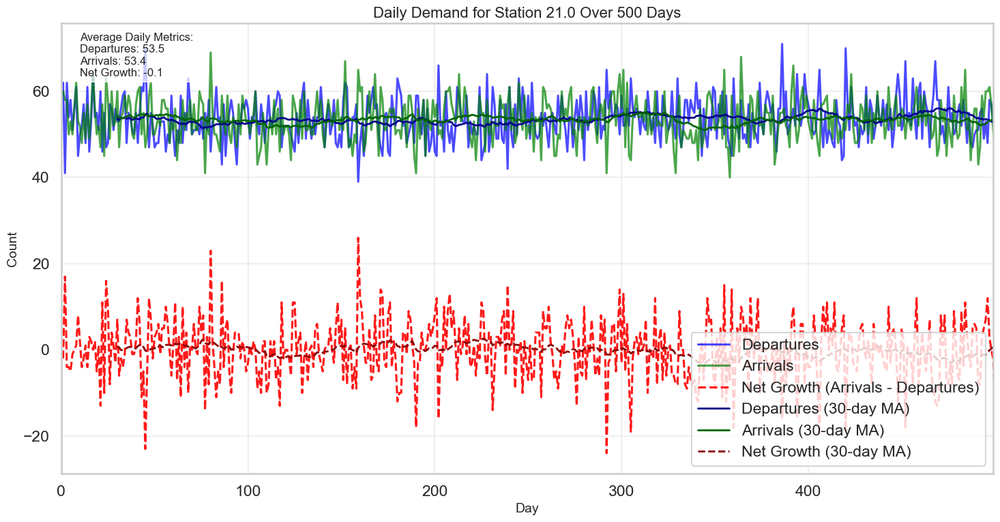

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

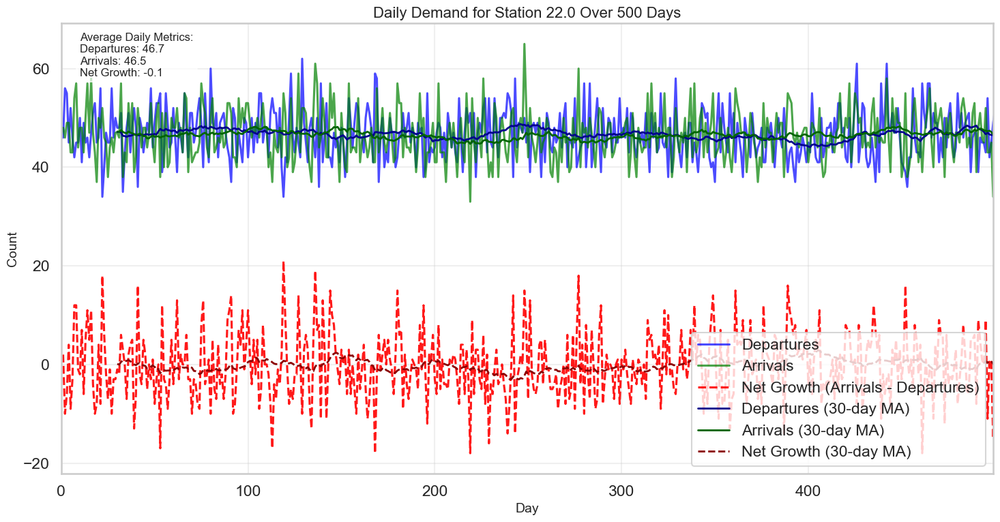

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

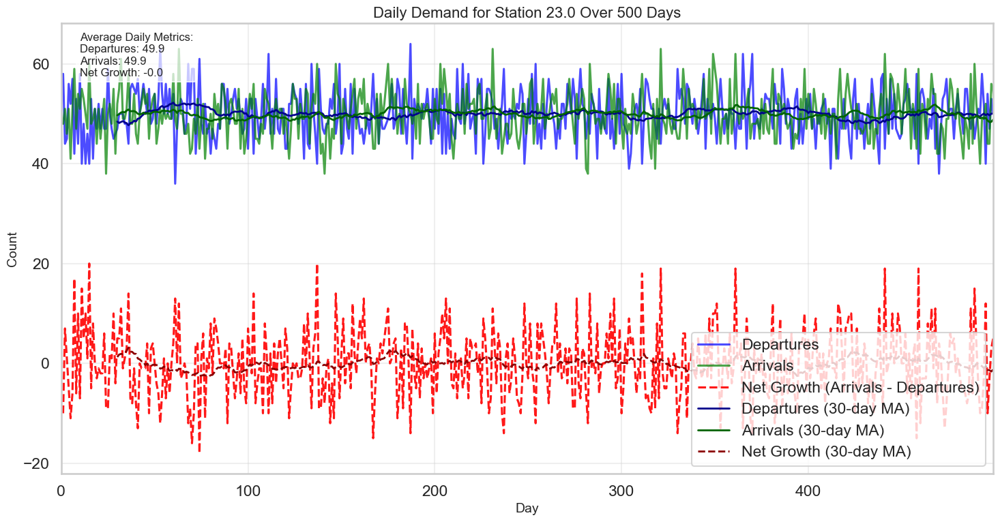

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

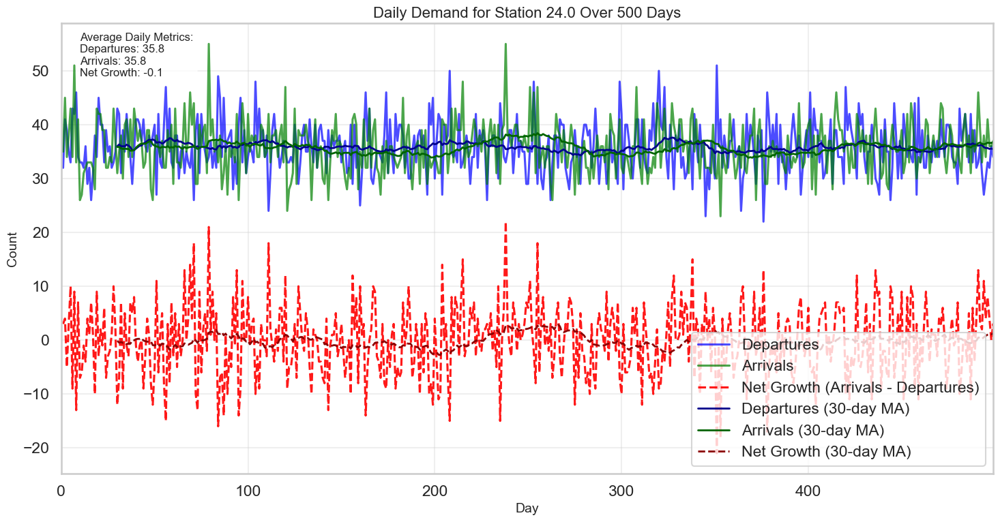

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

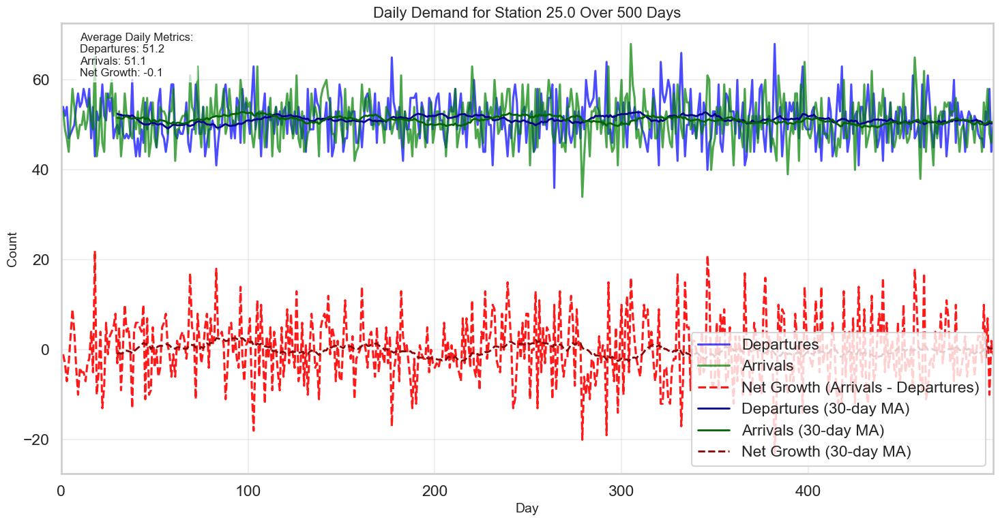

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

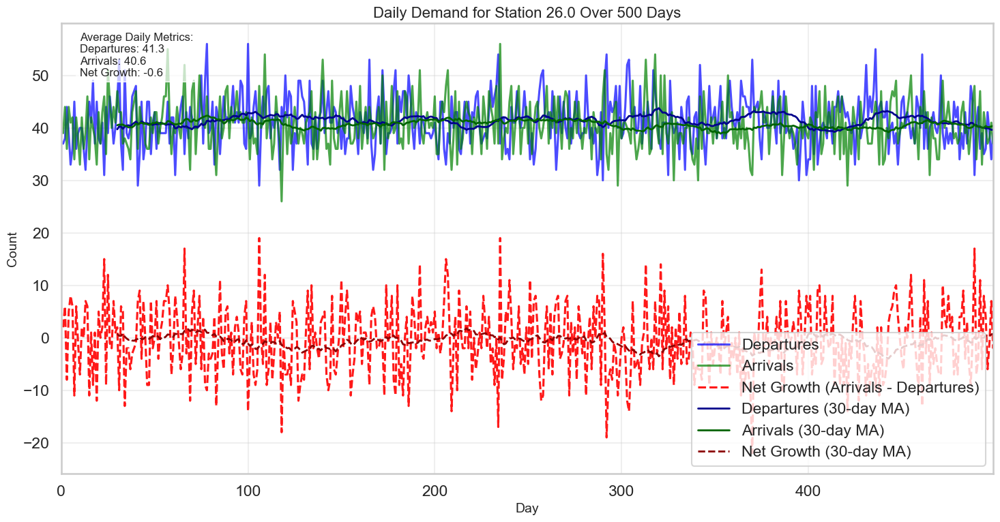

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

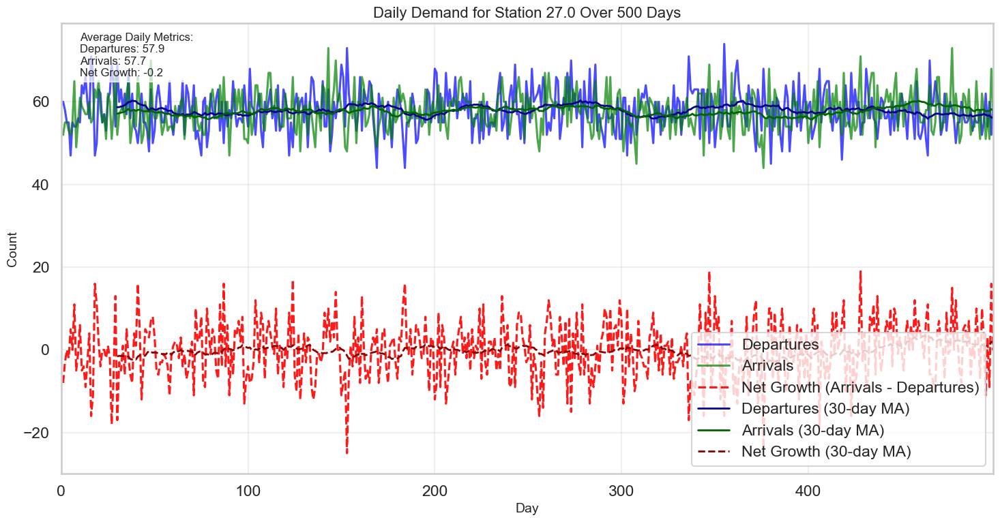

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

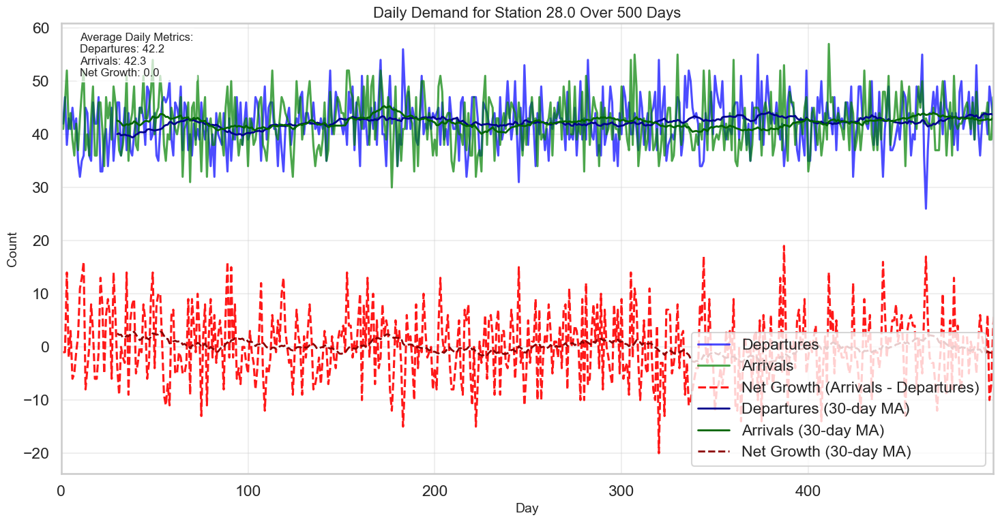

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_231

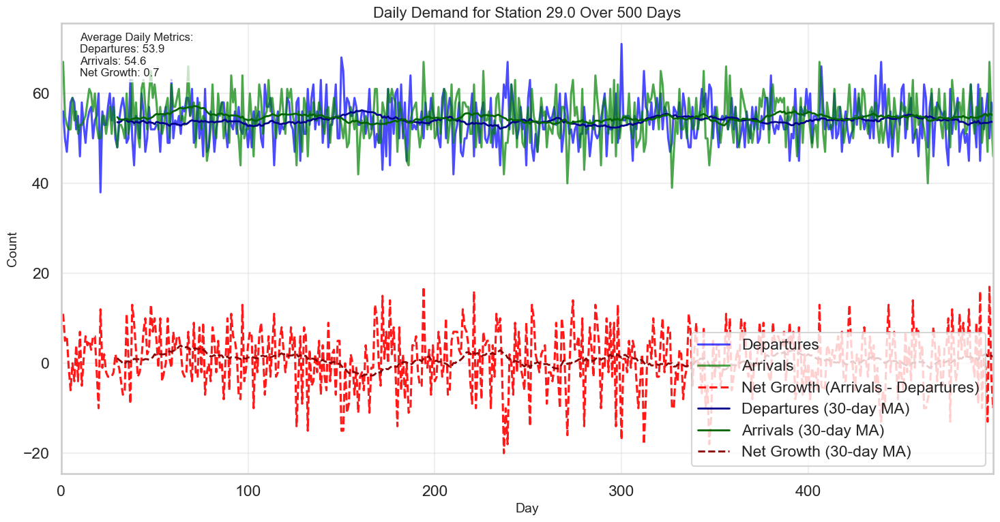

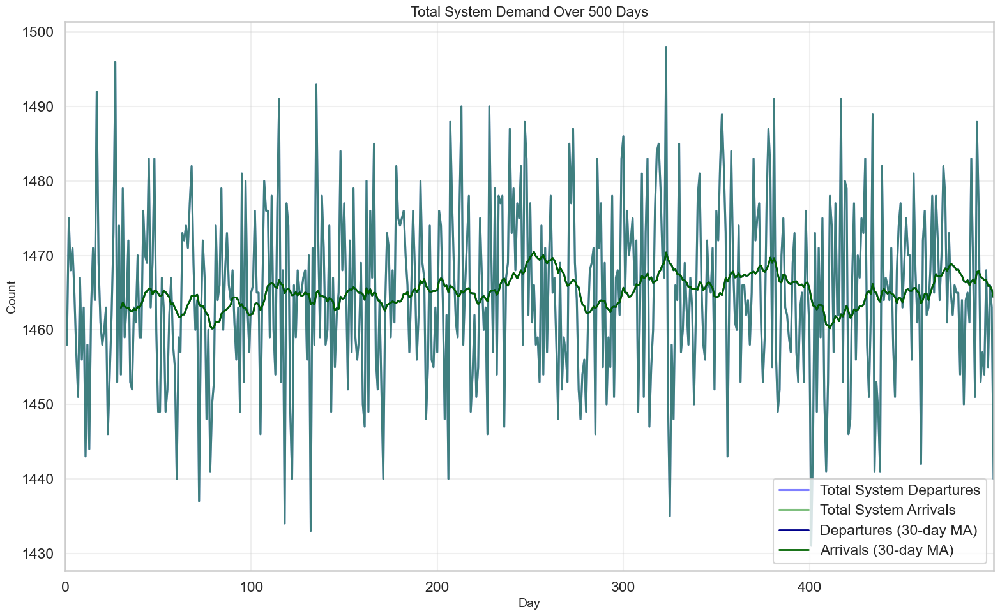

All plots have been saved to the 'station_demand_plots' directory
Combined PDF saved at: station_demand_plots/all_station_demand_curves.pdf
System-wide plot saved at: station_demand_plots/total_system_demand.png


<Figure size 1800x1200 with 0 Axes>

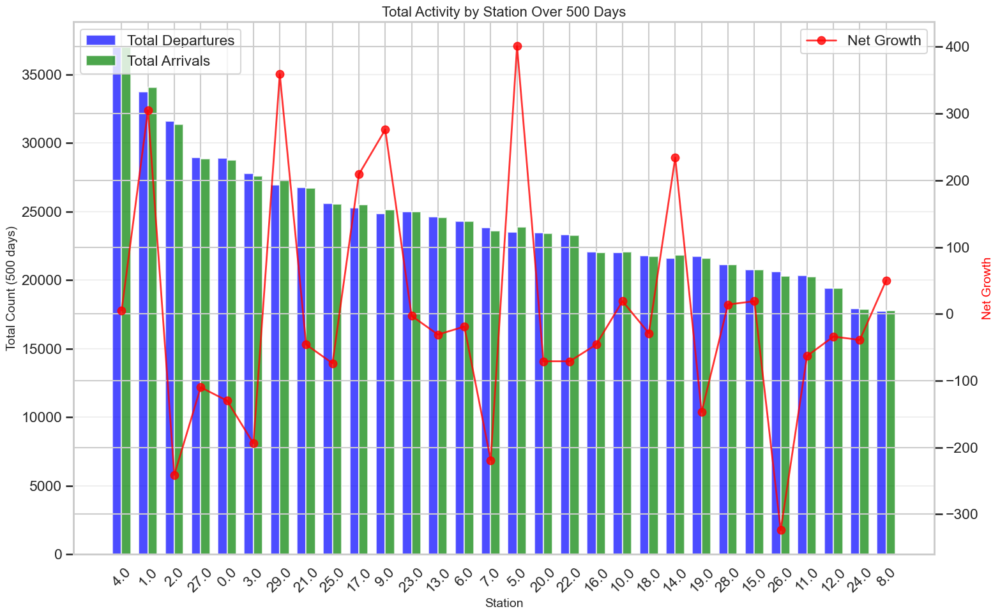

/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/882171072.py:233: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


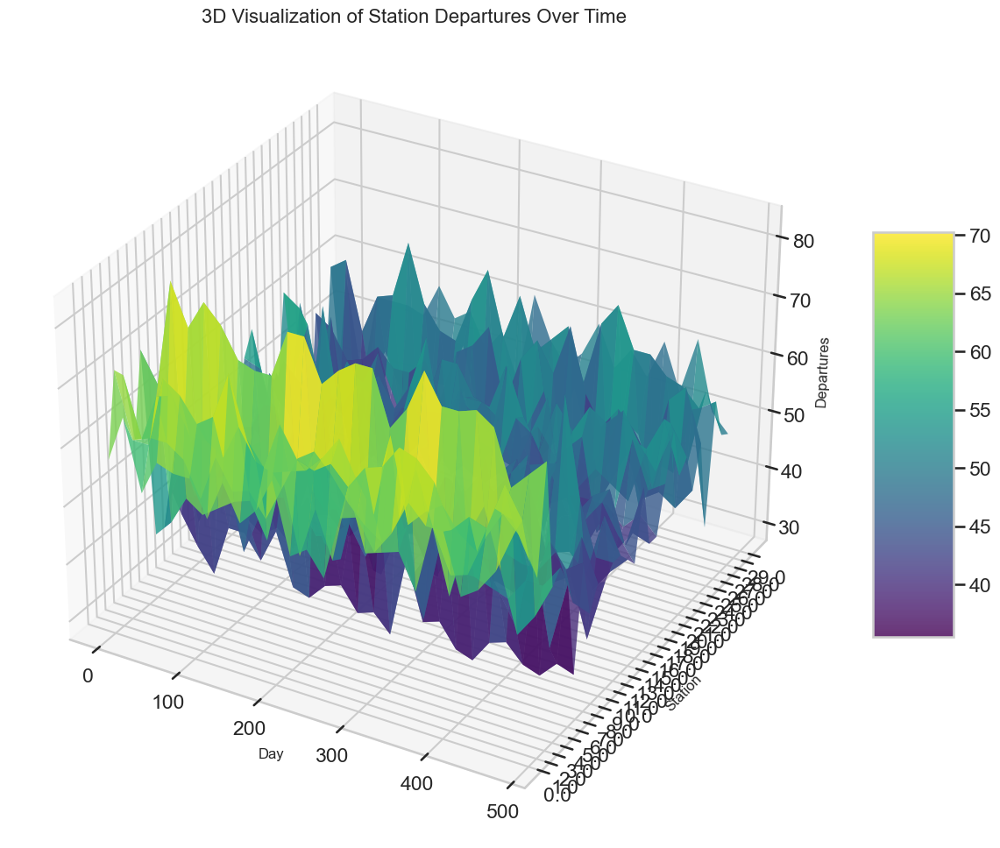

Additional visualizations saved to the 'station_demand_plots' directory


In [7]:
# Continue from the preprocessing code
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
import os

# Create directory for plots if it doesn't exist
output_dir = 'station_demand_plots'
os.makedirs(output_dir, exist_ok=True)

# Calculate daily demand metrics for each station
# We'll sum departures (outflow) and arrivals (inflow) for each day and station
daily_station_demand = df_demand.groupby(['day', 'station']).agg({
    'departure_count': 'sum',
    'arrival_count': 'sum',
    'net_growth': 'sum'
}).reset_index()

# Create a multi-page PDF to save all plots
pdf_path = os.path.join(output_dir, 'all_station_demand_curves.pdf')
with PdfPages(pdf_path) as pdf:
    # Get all unique stations
    all_stations = sorted(daily_station_demand['station'].unique())
    
    # Set up the figure size and style
    plt.figure(figsize=(15, 10))
    sns.set_style('whitegrid')
    
    # Create a plot for each station
    for station in all_stations:
        # Filter data for this station
        station_data = daily_station_demand[daily_station_demand['station'] == station]
        
        # Create a new figure for each station
        fig, ax = plt.subplots(figsize=(15, 8))
        
        # Plot the metrics over time
        ax.plot(station_data['day'], station_data['departure_count'], 
                label='Departures', color='blue', alpha=0.7)
        ax.plot(station_data['day'], station_data['arrival_count'], 
                label='Arrivals', color='green', alpha=0.7)
        ax.plot(station_data['day'], station_data['net_growth'], 
                label='Net Growth (Arrivals - Departures)', color='red', 
                linestyle='--', alpha=0.9)
        
        # Add rolling average (30-day) for smoother trend visualization
        window_size = 30
        if len(station_data) >= window_size:
            station_data['departures_ma'] = station_data['departure_count'].rolling(window=window_size).mean()
            station_data['arrivals_ma'] = station_data['arrival_count'].rolling(window=window_size).mean()
            station_data['net_growth_ma'] = station_data['net_growth'].rolling(window=window_size).mean()
            
            ax.plot(station_data['day'], station_data['departures_ma'], 
                    label='Departures (30-day MA)', color='darkblue', linewidth=2)
            ax.plot(station_data['day'], station_data['arrivals_ma'], 
                    label='Arrivals (30-day MA)', color='darkgreen', linewidth=2)
            ax.plot(station_data['day'], station_data['net_growth_ma'], 
                    label='Net Growth (30-day MA)', color='darkred', 
                    linestyle='--', linewidth=2)
        
        # Calculate basic statistics for this station
        avg_departures = station_data['departure_count'].mean()
        avg_arrivals = station_data['arrival_count'].mean()
        avg_net_growth = station_data['net_growth'].mean()
        
        # Add annotations and titles
        ax.set_title(f'Daily Demand for Station {station} Over 500 Days', fontsize=16)
        ax.set_xlabel('Day', fontsize=14)
        ax.set_ylabel('Count', fontsize=14)
        ax.set_xlim(0, 499)  # 500 days from 0 to 499
        ax.grid(True, alpha=0.3)
        
        # Add text box with statistics
        stats_text = (f'Average Daily Metrics:\n'
                      f'Departures: {avg_departures:.1f}\n'
                      f'Arrivals: {avg_arrivals:.1f}\n'
                      f'Net Growth: {avg_net_growth:.1f}')
        props = dict(boxstyle='round', facecolor='white', alpha=0.7)
        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, fontsize=12,
                verticalalignment='top', bbox=props)
        
        # Add legend
        ax.legend(loc='lower right')
        
        # Ensure layout is tight
        plt.tight_layout()
        
        # Save the current figure to the PDF
        pdf.savefig(fig)
        
        # Also save individual PNG files
        png_path = os.path.join(output_dir, f'station_{station}_demand.png')
        plt.savefig(png_path, dpi=100, bbox_inches='tight')
        
        # Show the plot (in Jupyter)
        plt.show()
        
        # Close the figure to free memory
        plt.close(fig)

# Create one combined plot showing total system demand
plt.figure(figsize=(16, 10))

# Aggregate all stations for each day
system_daily_demand = daily_station_demand.groupby('day').agg({
    'departure_count': 'sum',
    'arrival_count': 'sum',
    'net_growth': 'sum'
}).reset_index()

# Plot system-wide metrics
plt.plot(system_daily_demand['day'], system_daily_demand['departure_count'], 
         label='Total System Departures', color='blue', alpha=0.5)
plt.plot(system_daily_demand['day'], system_daily_demand['arrival_count'], 
         label='Total System Arrivals', color='green', alpha=0.5)

# Add 30-day moving averages
system_daily_demand['departures_ma'] = system_daily_demand['departure_count'].rolling(window=30).mean()
system_daily_demand['arrivals_ma'] = system_daily_demand['arrival_count'].rolling(window=30).mean()

plt.plot(system_daily_demand['day'], system_daily_demand['departures_ma'], 
         label='Departures (30-day MA)', color='darkblue', linewidth=2)
plt.plot(system_daily_demand['day'], system_daily_demand['arrivals_ma'], 
         label='Arrivals (30-day MA)', color='darkgreen', linewidth=2)

plt.title('Total System Demand Over 500 Days', fontsize=16)
plt.xlabel('Day', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xlim(0, 499)
plt.grid(True, alpha=0.3)
plt.legend(loc='best')
plt.tight_layout()

# Save the system-wide plot
system_plot_path = os.path.join(output_dir, 'total_system_demand.png')
plt.savefig(system_plot_path, dpi=100, bbox_inches='tight')

# Show the plot
plt.show()

print(f"All plots have been saved to the '{output_dir}' directory")
print(f"Combined PDF saved at: {pdf_path}")
print(f"System-wide plot saved at: {system_plot_path}")

# Create one more visualization: heatmap of station activity
plt.figure(figsize=(18, 12))

# Create a pivot table of total departures by station
station_activity = daily_station_demand.groupby('station').agg({
    'departure_count': 'sum',
    'arrival_count': 'sum',
    'net_growth': 'sum'
}).reset_index()

# Sort stations by total activity (departures + arrivals)
station_activity['total_activity'] = station_activity['departure_count'] + station_activity['arrival_count']
station_activity = station_activity.sort_values('total_activity', ascending=False)

# Create bar chart
fig, ax = plt.subplots(figsize=(16, 10))
x = np.arange(len(station_activity))
width = 0.35

# Plot departures and arrivals as bars
ax.bar(x - width/2, station_activity['departure_count'], width, label='Total Departures', color='blue', alpha=0.7)
ax.bar(x + width/2, station_activity['arrival_count'], width, label='Total Arrivals', color='green', alpha=0.7)

# Add net growth as a line
ax2 = ax.twinx()
ax2.plot(x, station_activity['net_growth'], 'ro-', label='Net Growth', linewidth=2, alpha=0.8)

# Customize axes
ax.set_xlabel('Station', fontsize=14)
ax.set_ylabel('Total Count (500 days)', fontsize=14)
ax2.set_ylabel('Net Growth', fontsize=14, color='red')
ax.set_title('Total Activity by Station Over 500 Days', fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(station_activity['station'], rotation=45)
ax.grid(True, axis='y', alpha=0.3)

# Add legends
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()

# Save this plot
station_comparison_path = os.path.join(output_dir, 'station_comparison.png')
plt.savefig(station_comparison_path, dpi=100, bbox_inches='tight')

# Show the plot
plt.show()

# Additional Analysis: Create a 3D visualization of station demand patterns
from mpl_toolkits.mplot3d import Axes3D

# First, let's create a pivot table with stations, days, and total activity
pivot_data = daily_station_demand.pivot_table(
    index='station', 
    columns='day', 
    values='departure_count'
).fillna(0)

# Sample a few days to make the visualization clearer (every 20 days)
sampled_days = range(0, 500, 20)
sampled_pivot = pivot_data.iloc[:, sampled_days]

# Create the 3D visualization
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection='3d')

# Setup the grid
stations = range(len(pivot_data.index))
days = sampled_days
X, Y = np.meshgrid(days, stations)
Z = sampled_pivot.values

# Plot the surface
surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8, edgecolor='none')

# Customize the visualization
ax.set_xlabel('Day', fontsize=12)
ax.set_ylabel('Station', fontsize=12)
ax.set_zlabel('Departures', fontsize=12)
ax.set_title('3D Visualization of Station Departures Over Time', fontsize=16)
ax.set_yticks(stations)
ax.set_yticklabels(pivot_data.index)

# Add a color bar
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

plt.tight_layout()

# Save this 3D visualization
viz_3d_path = os.path.join(output_dir, 'station_demand_3d.png')
plt.savefig(viz_3d_path, dpi=100, bbox_inches='tight')

# Show the plot
plt.show()

print(f"Additional visualizations saved to the '{output_dir}' directory")

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# Set plot style
plt.style.use('ggplot')
sns.set_context("talk")

# Get list of all unique stations
stations = sorted(df_demand['station'].unique())

# Create custom colormap (from blue to white to red)
colors = ["#0571b0", "#f7f7f7", "#ca0020"]  # Blue, white, red
cmap = LinearSegmentedColormap.from_list("demand_cmap", colors, N=100)

# Create directory for saving plots if it doesn't exist
import os
if not os.path.exists('station_plots'):
    os.makedirs('station_plots')

# Function to plot heatmap for a station
def plot_station_demand(station_id, df_demand):
    # Filter data for this station
    station_data = df_demand[df_demand['station'] == station_id].copy()
    
    # Create a pivot table: days as rows, intervals as columns, net_growth as values
    pivot_data = station_data.pivot(index='day', columns='interval_30min', values='net_growth')
    
    # Create figure with appropriate size
    plt.figure(figsize=(16, 10))
    
    # Calculate max absolute value for symmetric color scale
    vmax = max(abs(pivot_data.min().min()), abs(pivot_data.max().max()))
    
    # Plot heatmap
    ax = sns.heatmap(pivot_data, 
                cmap=cmap, 
                vmin=-vmax, vmax=vmax,
                center=0,
                xticklabels=4,  # Show every 4th interval label (2-hour intervals)
                yticklabels=50, # Show every 50th day
                cbar_kws={'label': 'Net Demand (arrivals - departures)'})
    
    # Set labels and title
    plt.title(f'Daily Demand Pattern for Station {station_id} Over 500 Days', fontsize=16)
    plt.xlabel('Time of Day (30-min intervals)', fontsize=14)
    plt.ylabel('Day', fontsize=14)
    
    # Add hour labels for better readability
    hour_labels = [f'{h}:00' for h in range(0, 24, 2)]
    ax.set_xticklabels(hour_labels, rotation=45)
    
    # Save the figure
    plt.tight_layout()
    plt.savefig(f'station_plots/station_{station_id}_demand.png', dpi=150)
    plt.close()

# Plot for each station
for station in stations:
    print(f"Plotting station {station}...")
    plot_station_demand(station, df_demand)
    
print(f"All {len(stations)} station plots saved to 'station_plots' directory")

# Additionally, create summary statistics for each station
station_stats = df_demand.groupby('station').agg({
    'departure_count': ['sum', 'mean'],
    'arrival_count': ['sum', 'mean'],
    'net_growth': ['mean', 'std', lambda x: abs(x).mean()]
}).reset_index()

# Rename columns
station_stats.columns = ['station', 'total_departures', 'avg_daily_departures', 
                        'total_arrivals', 'avg_daily_arrivals', 
                        'avg_net_demand', 'std_net_demand', 'avg_abs_demand_change']

# Sort by total activity (departures + arrivals)
station_stats['total_activity'] = station_stats['total_departures'] + station_stats['total_arrivals']
station_stats = station_stats.sort_values('total_activity', ascending=False)

# Save stats to CSV
station_stats.to_csv('station_demand_statistics.csv', index=False)
print("Station statistics saved to 'station_demand_statistics.csv'")

# Create a plot showing busiest stations
plt.figure(figsize=(14, 8))
sns.barplot(x='station', y='total_activity', data=station_stats.head(10))
plt.title('Top 10 Busiest Stations', fontsize=16)
plt.xlabel('Station ID', fontsize=14)
plt.ylabel('Total Activity (Departures + Arrivals)', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('busiest_stations.png', dpi=150)
plt.close()

# Create alternative visualization: line plots for selected stations
# Show daily patterns by hour for top 5 busiest stations
top_stations = station_stats.head(5)['station'].tolist()

# Calculate average hourly patterns
hourly_patterns = df_demand[df_demand['station'].isin(top_stations)].copy()
hourly_patterns['hour'] = hourly_patterns['interval_30min'] // 2
hourly_agg = hourly_patterns.groupby(['station', 'hour']).agg({
    'departure_count': 'mean',
    'arrival_count': 'mean',
    'net_growth': 'mean'
}).reset_index()

# Plot line charts
plt.figure(figsize=(15, 10))
for i, metric in enumerate(['departure_count', 'arrival_count', 'net_growth']):
    plt.subplot(3, 1, i+1)
    for station in top_stations:
        station_data = hourly_agg[hourly_agg['station'] == station]
        plt.plot(station_data['hour'], station_data[metric], label=f'Station {station}')
    
    plt.title(f'Average Hourly {metric.replace("_", " ").title()} by Station', fontsize=14)
    plt.xlabel('Hour of Day', fontsize=12)
    plt.ylabel('Average Count', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)
    
plt.tight_layout()
plt.savefig('hourly_patterns_top_stations.png', dpi=150)
plt.close()

Plotting station 0.0...
Plotting station 1.0...
Plotting station 2.0...
Plotting station 3.0...
Plotting station 4.0...
Plotting station 5.0...
Plotting station 6.0...
Plotting station 7.0...
Plotting station 8.0...
Plotting station 9.0...
Plotting station 10.0...
Plotting station 11.0...
Plotting station 12.0...
Plotting station 13.0...
Plotting station 14.0...
Plotting station 15.0...
Plotting station 16.0...
Plotting station 17.0...
Plotting station 18.0...
Plotting station 19.0...
Plotting station 20.0...
Plotting station 21.0...
Plotting station 22.0...
Plotting station 23.0...
Plotting station 24.0...
Plotting station 25.0...
Plotting station 26.0...
Plotting station 27.0...
Plotting station 28.0...
Plotting station 29.0...
All 30 station plots saved to 'station_plots' directory
Station statistics saved to 'station_demand_statistics.csv'


/var/folders/1y/h52hbl612h9dbs3xm_blfxlc0000gn/T/ipykernel_23113/3789942756.py:312: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(commuter_data, labels=labels)


Cluster characteristics:
   cluster  station_count  morning_dep_peak_mean  morning_arr_peak_mean  \
0        1              4               0.383250                6.89975   
1        2              1               0.435000               10.23600   
2        3             17               2.607294                1.87200   
3        4              8               3.723375                1.78175   

   evening_dep_peak_mean  evening_arr_peak_mean  commuter_index_mean  \
0               8.032250                0.64350           -55.431656   
1              12.035000                0.64400          -122.910120   
2               2.229235                3.52600             5.121523   
3               2.412875                4.81375            13.304154   

   commuter_index_std  
0           11.447264  
1                 NaN  
2            3.369840  
3            4.286460  
Daily pattern analysis complete! All visualizations saved to 'daily_patterns' directory.


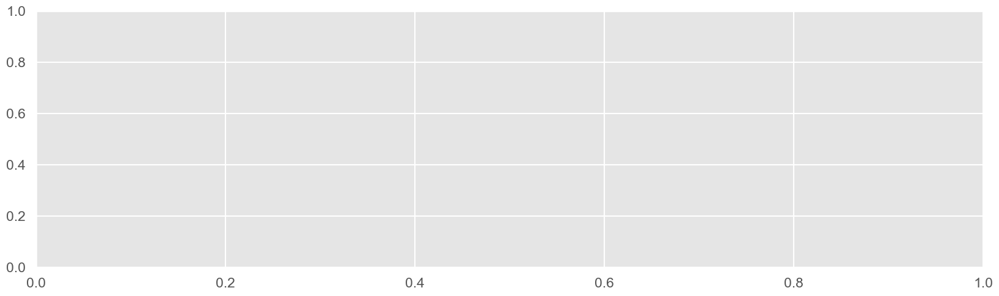

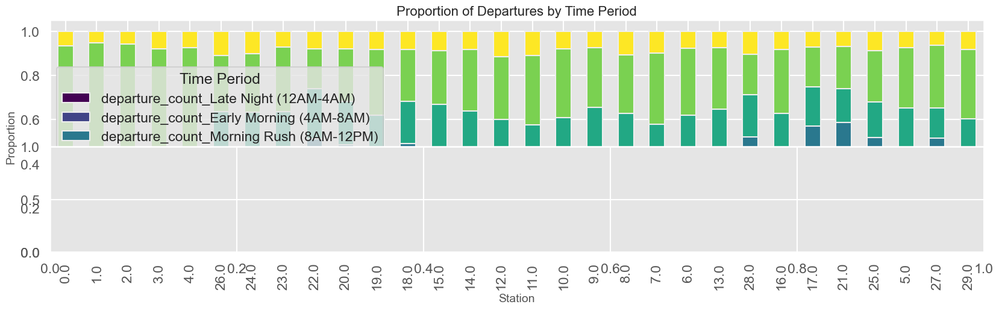

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec
import matplotlib.dates as mdates
from datetime import datetime, timedelta
import os

# Set plot style
plt.style.use('ggplot')
sns.set_context("talk")
sns.set_palette("colorblind")

# Create a directory for saving the new plots
if not os.path.exists('daily_patterns'):
    os.makedirs('daily_patterns')

# Get list of all unique stations
stations = sorted(df_demand['station'].unique())

# First, let's transform our 30-minute intervals into actual times for better visualization
def create_daily_patterns_df(df_demand):
    # Create a copy to avoid modifying the original
    df_patterns = df_demand.copy()
    
    # Convert interval to time
    df_patterns['time'] = df_patterns['interval_30min'].apply(
        lambda x: (datetime(2023, 1, 1) + timedelta(minutes=30*x)).strftime('%H:%M')
    )
    
    # Create hour and minute columns for easier grouping
    df_patterns['hour'] = df_patterns['interval_30min'] // 2
    df_patterns['minute'] = (df_patterns['interval_30min'] % 2) * 30
    
    # Create period label for easier interpretation
    time_periods = {
        0: 'Late Night (12AM-4AM)', 
        1: 'Early Morning (4AM-8AM)', 
        2: 'Morning Rush (8AM-12PM)',
        3: 'Afternoon (12PM-4PM)', 
        4: 'Evening Rush (4PM-8PM)', 
        5: 'Night (8PM-12AM)'
    }
    df_patterns['period'] = df_patterns['hour'].apply(lambda x: time_periods[x//4])
    
    return df_patterns

df_patterns = create_daily_patterns_df(df_demand)

# Calculate hourly averages for each station
# First group by day, station, and hour to handle any duplicates
hourly_by_day = df_patterns.groupby(['day', 'station', 'hour'])[
    ['departure_count', 'arrival_count', 'net_growth']
].mean().reset_index()

# Then average across all days
hourly_avg = hourly_by_day.groupby(['station', 'hour'])[
    ['departure_count', 'arrival_count', 'net_growth']
].mean().reset_index()

# 1. DAILY PATTERN HEATMAP
# ------------------------
plt.figure(figsize=(20, 20))

metrics = ['departure_count', 'arrival_count', 'net_growth']
titles = ['Departures', 'Arrivals', 'Net Demand (Arrivals - Departures)']

for i, (metric, title) in enumerate(zip(metrics, titles)):
    plt.subplot(3, 1, i+1)
    
    # Create a pivot table for the heatmap
    pivot_data = pd.pivot_table(
        hourly_avg, 
        values=metric,
        index='station',
        columns='hour',
        aggfunc='mean'
    )
    
    # Sort stations for better visualization
    if metric != 'net_growth':
        # Sort by morning rush hour activity
        morning_activity = pivot_data.iloc[:, 7:11].mean(axis=1)
        pivot_data = pivot_data.loc[morning_activity.sort_values(ascending=False).index]
    
    # Plot heatmap
    if metric == 'net_growth':
        # For net growth, use a diverging colormap centered at zero
        vmax = max(abs(pivot_data.min().min()), abs(pivot_data.max().max()))
        sns.heatmap(pivot_data, cmap='RdBu_r', center=0, vmin=-vmax, vmax=vmax)
    else:
        # For counts, use a sequential colormap
        sns.heatmap(pivot_data, cmap='viridis')
    
    # Add labels
    plt.title(f'{title} Pattern Throughout the Day', fontsize=16)
    plt.xlabel('Hour of Day', fontsize=14)
    plt.ylabel('Station ID', fontsize=14)
    
    # Improve hour labels
    hour_labels = [f'{h:02d}:00' for h in range(24)]
    plt.xticks(range(24), hour_labels, rotation=45)

plt.suptitle('Daily Demand Patterns Across All Stations', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig('daily_patterns/all_stations_daily_patterns.png', dpi=150)
plt.close()

# 2. STATION CLUSTERING
# --------------------
# Prepare data for clustering by creating a feature matrix
station_features = pd.DataFrame(index=stations)

# Add features: hourly demand patterns
for hour in range(24):
    hour_data = hourly_avg[hourly_avg['hour'] == hour]
    for metric in ['departure_count', 'arrival_count']:
        station_features[f'{metric}_hour_{hour}'] = hour_data.set_index('station')[metric]

# Fill missing values with zeros
station_features = station_features.fillna(0)

# Use hierarchical clustering to group stations
from scipy.cluster.hierarchy import linkage, fcluster

# Compute linkage
Z = linkage(station_features.values, method='ward')

# Create 4 clusters
n_clusters = 4
clusters = fcluster(Z, n_clusters, criterion='maxclust')

# Add cluster labels to stations
station_clusters = pd.DataFrame({
    'station': station_features.index,
    'cluster': clusters
})

# 3. VISUALIZE CLUSTER PATTERNS
# ----------------------------
# Add cluster information to hourly averages
hourly_avg_clustered = hourly_avg.merge(station_clusters, on='station')

# Plot average patterns for each cluster
plt.figure(figsize=(18, 15))

for i, metric in enumerate(['departure_count', 'arrival_count', 'net_growth']):
    plt.subplot(3, 1, i+1)
    
    for cluster_id in range(1, n_clusters + 1):
        # Get data for this cluster
        cluster_data = hourly_avg_clustered[hourly_avg_clustered['cluster'] == cluster_id]
        
        # Calculate average by hour
        avg_by_hour = cluster_data.groupby('hour')[metric].mean()
        
        # Plot
        plt.plot(avg_by_hour.index, avg_by_hour.values, 'o-', linewidth=3, 
                 label=f'Cluster {cluster_id} ({sum(clusters == cluster_id)} stations)')
    
    plt.title(f'Average {metric.replace("_", " ").title()} Pattern by Cluster', fontsize=16)
    plt.xlabel('Hour of Day', fontsize=14)
    plt.ylabel('Average Count', fontsize=14)
    plt.xticks(range(0, 24, 2), [f'{h:02d}:00' for h in range(0, 24, 2)], rotation=45)
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=12)

plt.suptitle('Daily Patterns by Station Cluster', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig('daily_patterns/cluster_patterns.png', dpi=150)
plt.close()

# 4. REPRESENTATIVE STATIONS FROM EACH CLUSTER
# -------------------------------------------
# For each cluster, visualize a few typical stations
plt.figure(figsize=(18, 20))

for cluster_id in range(1, n_clusters + 1):
    plt.subplot(n_clusters, 1, cluster_id)
    
    # Get stations in this cluster
    cluster_stations = station_clusters[station_clusters['cluster'] == cluster_id]['station'].values
    
    # Select up to 3 stations to show
    stations_to_show = cluster_stations[:min(3, len(cluster_stations))]
    
    for station in stations_to_show:
        station_data = hourly_avg[hourly_avg['station'] == station]
        
        # Plot departures
        plt.plot(station_data['hour'], station_data['departure_count'], 
                 'o-', linewidth=2, label=f'Station {station} (Departures)')
        
        # Plot arrivals
        plt.plot(station_data['hour'], station_data['arrival_count'], 
                 'o--', linewidth=2, label=f'Station {station} (Arrivals)')
    
    plt.title(f'Cluster {cluster_id} Sample Stations', fontsize=14)
    plt.ylabel('Count', fontsize=12)
    plt.xlabel('Hour of Day', fontsize=12)
    plt.xticks(range(0, 24, 2), [f'{h:02d}:00' for h in range(0, 24, 2)], rotation=45)
    plt.grid(True, alpha=0.3)
    plt.legend()

plt.suptitle('Sample Stations from Each Cluster', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig('daily_patterns/sample_stations.png', dpi=150)
plt.close()

# 5. PEAK ANALYSIS
# ---------------
# Analyze morning and evening peak patterns
def analyze_peaks(hourly_avg):
    # Define morning and evening periods
    morning_hours = range(6, 11)  # 6AM-10AM
    evening_hours = range(16, 20)  # 4PM-8PM
    
    peaks = []
    
    for station in hourly_avg['station'].unique():
        station_data = hourly_avg[hourly_avg['station'] == station]
        
        # Find morning peaks
        morning_data = station_data[station_data['hour'].isin(morning_hours)]
        if not morning_data.empty:
            morning_dep_peak = morning_data['departure_count'].max()
            morning_arr_peak = morning_data['arrival_count'].max()
        else:
            morning_dep_peak = morning_arr_peak = 0
        
        # Find evening peaks
        evening_data = station_data[station_data['hour'].isin(evening_hours)]
        if not evening_data.empty:
            evening_dep_peak = evening_data['departure_count'].max()
            evening_arr_peak = evening_data['arrival_count'].max()
        else:
            evening_dep_peak = evening_arr_peak = 0
        
        # Calculate commuter index (positive for residential, negative for business)
        commuter_index = (morning_dep_peak * evening_arr_peak) - (morning_arr_peak * evening_dep_peak)
        
        peaks.append({
            'station': station,
            'morning_dep_peak': morning_dep_peak,
            'morning_arr_peak': morning_arr_peak,
            'evening_dep_peak': evening_dep_peak,
            'evening_arr_peak': evening_arr_peak,
            'commuter_index': commuter_index
        })
    
    return pd.DataFrame(peaks)

# Calculate peak statistics
peak_stats = analyze_peaks(hourly_avg)

# Add cluster information
peak_stats = peak_stats.merge(station_clusters, on='station')

# Create visualization of peaks
plt.figure(figsize=(18, 12))

# Plot 1: Morning vs Evening Departures
plt.subplot(2, 2, 1)
for cluster_id in range(1, n_clusters + 1):
    cluster_data = peak_stats[peak_stats['cluster'] == cluster_id]
    plt.scatter(
        cluster_data['morning_dep_peak'],
        cluster_data['evening_dep_peak'],
        label=f'Cluster {cluster_id}',
        alpha=0.7,
        s=80
    )

plt.plot([0, plt.xlim()[1]], [0, plt.xlim()[1]], 'k--', alpha=0.3)  # Add diagonal line
plt.title('Morning vs Evening Departure Peaks', fontsize=14)
plt.xlabel('Morning Departure Peak (6AM-10AM)', fontsize=12)
plt.ylabel('Evening Departure Peak (4PM-8PM)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.legend()

# Plot 2: Morning vs Evening Arrivals
plt.subplot(2, 2, 2)
for cluster_id in range(1, n_clusters + 1):
    cluster_data = peak_stats[peak_stats['cluster'] == cluster_id]
    plt.scatter(
        cluster_data['morning_arr_peak'],
        cluster_data['evening_arr_peak'],
        label=f'Cluster {cluster_id}',
        alpha=0.7,
        s=80
    )

plt.plot([0, plt.xlim()[1]], [0, plt.xlim()[1]], 'k--', alpha=0.3)  # Add diagonal line
plt.title('Morning vs Evening Arrival Peaks', fontsize=14)
plt.xlabel('Morning Arrival Peak (6AM-10AM)', fontsize=12)
plt.ylabel('Evening Arrival Peak (4PM-8PM)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.legend()

# Plot 3: Commuter Index
plt.subplot(2, 1, 2)
commuter_data = []
labels = []

for cluster_id in range(1, n_clusters + 1):
    cluster_data = peak_stats[peak_stats['cluster'] == cluster_id]
    commuter_data.append(cluster_data['commuter_index'].values)
    labels.append(f'Cluster {cluster_id}')

plt.boxplot(commuter_data, labels=labels)
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.title('Commuter Index by Cluster', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Commuter Index\n(-: Business District, +: Residential)', fontsize=12)
plt.grid(True, alpha=0.3)

plt.suptitle('Peak Demand Analysis', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig('daily_patterns/peak_analysis.png', dpi=150)
plt.close()

# 6. TIME PERIOD ANALYSIS
# ----------------------
# Analyze demand by time period
# First, calculate average demand in each period for each station
period_analysis = df_patterns.groupby(['station', 'period'])[
    ['departure_count', 'arrival_count']
].mean().reset_index()

# Create a pivot table
period_pivot = pd.pivot_table(
    period_analysis,
    values=['departure_count', 'arrival_count'],
    index='station',
    columns='period'
)

# Define periods in chronological order
period_order = [
    'Late Night (12AM-4AM)', 
    'Early Morning (4AM-8AM)', 
    'Morning Rush (8AM-12PM)',
    'Afternoon (12PM-4PM)', 
    'Evening Rush (4PM-8PM)', 
    'Night (8PM-12AM)'
]

# Calculate proportions for each station
proportions = pd.DataFrame(index=period_pivot.index)

for metric in ['departure_count', 'arrival_count']:
    for station in proportions.index:
        station_total = period_pivot.loc[station, metric].sum()
        if station_total > 0:
            for period in period_order:
                if (metric, period) in period_pivot.columns:
                    proportions.loc[station, f'{metric}_{period}'] = period_pivot.loc[station, (metric, period)] / station_total
                else:
                    proportions.loc[station, f'{metric}_{period}'] = 0

# Add cluster information
proportions = proportions.reset_index().merge(station_clusters, on='station').set_index('station')

# Sort by cluster
proportions = proportions.sort_values('cluster')

# Create stacked bar chart of time period distribution
plt.figure(figsize=(20, 12))

# Plot departures
plt.subplot(2, 1, 1)
dep_cols = [f'departure_count_{period}' for period in period_order if f'departure_count_{period}' in proportions.columns]
proportions[dep_cols].plot(
    kind='bar',
    stacked=True,
    figsize=(20, 5),
    colormap='viridis'
)
plt.title('Proportion of Departures by Time Period', fontsize=16)
plt.xlabel('Station', fontsize=14)
plt.ylabel('Proportion', fontsize=14)
plt.xticks(rotation=90)
plt.legend(title='Time Period')

# Plot arrivals
plt.subplot(2, 1, 2)
arr_cols = [f'arrival_count_{period}' for period in period_order if f'arrival_count_{period}' in proportions.columns]
proportions[arr_cols].plot(
    kind='bar',
    stacked=True,
    figsize=(20, 5),
    colormap='viridis'
)
plt.title('Proportion of Arrivals by Time Period', fontsize=16)
plt.xlabel('Station', fontsize=14)
plt.ylabel('Proportion', fontsize=14)
plt.xticks(rotation=90)
plt.legend(title='Time Period')

plt.suptitle('Time Period Distribution by Station', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig('daily_patterns/time_period_distribution.png', dpi=150)
plt.close()

# 7. CLUSTER CHARACTERISTICS SUMMARY
# --------------------------------
# Create a summary of each cluster's characteristics
cluster_summary = peak_stats.groupby('cluster').agg({
    'station': 'count',
    'morning_dep_peak': 'mean',
    'morning_arr_peak': 'mean',
    'evening_dep_peak': 'mean',
    'evening_arr_peak': 'mean',
    'commuter_index': ['mean', 'std']
}).reset_index()

# Flatten the MultiIndex columns
cluster_summary.columns = [
    'cluster' if col[0] == 'cluster' else f'{col[0]}_{col[1]}'
    for col in cluster_summary.columns
]

# Print and save summary
print("Cluster characteristics:")
print(cluster_summary)
cluster_summary.to_csv('daily_patterns/cluster_summary.csv', index=False)

# Plot key characteristics
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.bar(cluster_summary['cluster'], cluster_summary['station_count'])
plt.title('Number of Stations per Cluster', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Number of Stations', fontsize=12)
plt.xticks(cluster_summary['cluster'])

plt.subplot(2, 2, 2)
plt.bar(cluster_summary['cluster'], cluster_summary['commuter_index_mean'])
plt.title('Average Commuter Index by Cluster', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Commuter Index', fontsize=12)
plt.xticks(cluster_summary['cluster'])
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)

# Compare morning/evening patterns
plt.subplot(2, 1, 2)
width = 0.35
x = np.arange(len(cluster_summary))

plt.bar(x - width/2, cluster_summary['morning_dep_peak_mean'], width, label='Morning Departures')
plt.bar(x + width/2, cluster_summary['morning_arr_peak_mean'], width, label='Morning Arrivals')
plt.bar(x - width/2, -cluster_summary['evening_dep_peak_mean'], width, label='Evening Departures')
plt.bar(x + width/2, -cluster_summary['evening_arr_peak_mean'], width, label='Evening Arrivals')

plt.title('Morning vs Evening Demand Patterns by Cluster', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Average Peak Demand\n(Morning above, Evening below)', fontsize=12)
plt.xticks(x, cluster_summary['cluster'])
plt.legend()
plt.grid(True, alpha=0.3)

plt.suptitle('Cluster Characteristics Summary', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig('daily_patterns/cluster_characteristics.png', dpi=150)
plt.close()

# Save cluster assignments for future reference
station_clusters.to_csv('daily_patterns/station_clusters.csv', index=False)
peak_stats.to_csv('daily_patterns/station_peak_stats.csv', index=False)

print("Daily pattern analysis complete! All visualizations saved to 'daily_patterns' directory.")

## demand forecasting

In [22]:
pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 22.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
import xgboost as xgb
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Create directory for saving forecasts
import os
if not os.path.exists('forecasts'):
    os.makedirs('forecasts')

# 1. IMPROVED HOURLY PATTERN ANALYSIS
# ---------------------------------

def analyze_hourly_patterns(hourly_avg_clustered, station_clusters):
    """Create detailed analysis of hourly demand patterns"""
    
    # Dictionary to store results
    hourly_pattern_results = {}
    
    # For each cluster
    for cluster in range(1, len(station_clusters['cluster'].unique()) + 1):
        # Get data for this cluster
        cluster_data = hourly_avg_clustered[hourly_avg_clustered['cluster'] == cluster]
        
        # If cluster is empty, skip
        if cluster_data.empty:
            continue
            
        # Average across all stations in the cluster to get typical pattern
        hourly_pattern = cluster_data.groupby('hour')[['departure_count', 'arrival_count']].mean().reset_index()
        
        # Calculate net flow (arrivals - departures) to understand imbalance
        hourly_pattern['net_flow'] = hourly_pattern['arrival_count'] - hourly_pattern['departure_count']
        
        # Calculate activity (arrivals + departures) to understand busyness
        hourly_pattern['activity'] = hourly_pattern['arrival_count'] + hourly_pattern['departure_count']
        
        # Calculate ratio of arrivals to departures
        # Add small epsilon to avoid division by zero
        hourly_pattern['arrival_ratio'] = hourly_pattern['arrival_count'] / (hourly_pattern['departure_count'] + 1e-10)
        
        # Calculate period labels for better interpretation
        conditions = [
            (hourly_pattern['hour'] >= 0) & (hourly_pattern['hour'] < 6),
            (hourly_pattern['hour'] >= 6) & (hourly_pattern['hour'] < 10),
            (hourly_pattern['hour'] >= 10) & (hourly_pattern['hour'] < 16),
            (hourly_pattern['hour'] >= 16) & (hourly_pattern['hour'] < 20),
            (hourly_pattern['hour'] >= 20) & (hourly_pattern['hour'] < 24)
        ]
        time_periods = ['Night (12AM-6AM)', 'Morning Rush (6AM-10AM)', 
                        'Midday (10AM-4PM)', 'Evening Rush (4PM-8PM)', 
                        'Evening (8PM-12AM)']
        hourly_pattern['period'] = np.select(conditions, time_periods)
        
        # Store results
        hourly_pattern_results[cluster] = hourly_pattern
        
        # Create detailed visualization
        fig, axes = plt.subplots(2, 2, figsize=(20, 12))
        
        # Plot 1: Departures and Arrivals
        ax1 = axes[0, 0]
        ax1.plot(hourly_pattern['hour'], hourly_pattern['departure_count'], 
                'o-', label='Departures', linewidth=2)
        ax1.plot(hourly_pattern['hour'], hourly_pattern['arrival_count'], 
                'o-', label='Arrivals', linewidth=2)
        ax1.set_title(f'Hourly Departures and Arrivals - Cluster {cluster}', fontsize=14)
        ax1.set_xlabel('Hour of Day', fontsize=12)
        ax1.set_ylabel('Average Count', fontsize=12)
        ax1.set_xticks(range(0, 24, 2))
        ax1.set_xticklabels([f'{h:02d}:00' for h in range(0, 24, 2)], rotation=45)
        ax1.grid(True, alpha=0.3)
        ax1.legend()
        
        # Add period highlighting
        period_colors = ['lightgray', 'lightyellow', 'lightblue', 'lightyellow', 'lightgray']
        for i, period in enumerate(time_periods):
            # Get min and max hours for this period
            if i == 0:
                min_h, max_h = 0, 6
            elif i == 1:
                min_h, max_h = 6, 10
            elif i == 2:
                min_h, max_h = 10, 16
            elif i == 3:
                min_h, max_h = 16, 20
            else:
                min_h, max_h = 20, 24
            
            # Highlight period
            ax1.axvspan(min_h - 0.5, max_h - 0.5, color=period_colors[i], alpha=0.3)
            
            # Add period label
            mid_point = (min_h + max_h) / 2
            y_pos = 0.9 * ax1.get_ylim()[1]
            ax1.text(mid_point, y_pos, period, ha='center', fontsize=10, 
                    bbox=dict(facecolor='white', alpha=0.7))
        
        # Plot 2: Net Flow (positive means more arrivals than departures)
        ax2 = axes[0, 1]
        bars = ax2.bar(hourly_pattern['hour'], hourly_pattern['net_flow'], 
               color=np.where(hourly_pattern['net_flow'] >= 0, 'green', 'red'))
        ax2.set_title(f'Hourly Net Flow (Arrivals - Departures) - Cluster {cluster}', fontsize=14)
        ax2.set_xlabel('Hour of Day', fontsize=12)
        ax2.set_ylabel('Net Flow', fontsize=12)
        ax2.set_xticks(range(0, 24, 2))
        ax2.set_xticklabels([f'{h:02d}:00' for h in range(0, 24, 2)], rotation=45)
        ax2.grid(True, alpha=0.3)
        ax2.axhline(y=0, color='black', linestyle='-', alpha=0.7)
        
        # Add annotations for significant imbalances
        for i, v in enumerate(hourly_pattern['net_flow']):
            if abs(v) > 0.2 * max(abs(hourly_pattern['net_flow'])):
                ax2.text(i, v + (0.1 * v if v > 0 else -0.1 * v), 
                       f"{v:.1f}", ha='center', fontsize=9)
        
        # Plot 3: Total Activity
        ax3 = axes[1, 0]
        ax3.bar(hourly_pattern['hour'], hourly_pattern['activity'], color='blue', alpha=0.7)
        ax3.set_title(f'Hourly Total Activity (Departures + Arrivals) - Cluster {cluster}', fontsize=14)
        ax3.set_xlabel('Hour of Day', fontsize=12)
        ax3.set_ylabel('Total Activity', fontsize=12)
        ax3.set_xticks(range(0, 24, 2))
        ax3.set_xticklabels([f'{h:02d}:00' for h in range(0, 24, 2)], rotation=45)
        ax3.grid(True, alpha=0.3)
        
        # Add annotations for peak hours
        peak_hours = hourly_pattern.sort_values('activity', ascending=False).head(3)['hour'].values
        for hour in peak_hours:
            activity = hourly_pattern.loc[hourly_pattern['hour'] == hour, 'activity'].values[0]
            ax3.text(hour, activity * 1.05, f"Peak: {activity:.1f}", ha='center', fontsize=10,
                   bbox=dict(facecolor='white', alpha=0.7))
        
        # Plot 4: Arrival to Departure Ratio
        ax4 = axes[1, 1]
        ax4.plot(hourly_pattern['hour'], hourly_pattern['arrival_ratio'], 'o-', color='purple', linewidth=2)
        ax4.set_title(f'Hourly Arrival/Departure Ratio - Cluster {cluster}', fontsize=14)
        ax4.set_xlabel('Hour of Day', fontsize=12)
        ax4.set_ylabel('Ratio (>1 means more arrivals)', fontsize=12)
        ax4.set_xticks(range(0, 24, 2))
        ax4.set_xticklabels([f'{h:02d}:00' for h in range(0, 24, 2)], rotation=45)
        ax4.grid(True, alpha=0.3)
        ax4.axhline(y=1, color='black', linestyle='--', alpha=0.7)
        
        # Annotate extreme ratio points
        for i, ratio in enumerate(hourly_pattern['arrival_ratio']):
            if ratio > 2 or ratio < 0.5:
                ax4.text(hourly_pattern.iloc[i]['hour'], ratio, f"{ratio:.1f}", ha='center', fontsize=9,
                       bbox=dict(facecolor='white', alpha=0.7))
        
        plt.suptitle(f'Detailed Hourly Demand Analysis - Cluster {cluster}', fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.97])
        plt.savefig(f'forecasts/hourly_analysis_cluster_{cluster}.png', dpi=150)
        plt.close()
        
        # Create an operational recommendations report for this cluster
        with open(f'forecasts/cluster_{cluster}_operational_insights.txt', 'w') as f:
            f.write(f"OPERATIONAL INSIGHTS FOR CLUSTER {cluster}\n")
            f.write("="*40 + "\n\n")
            
            # Identify peak hours
            peak_demand_hour = hourly_pattern['departure_count'].idxmax()
            peak_demand_val = hourly_pattern.loc[peak_demand_hour, 'departure_count']
            peak_supply_hour = hourly_pattern['arrival_count'].idxmax()
            peak_supply_val = hourly_pattern.loc[peak_supply_hour, 'arrival_count']
            
            f.write(f"1. PEAK TIMES:\n")
            f.write(f"   - Highest departures: {hourly_pattern.loc[peak_demand_hour, 'hour']:02d}:00 ({peak_demand_val:.1f} bikes)\n")
            f.write(f"   - Highest arrivals: {hourly_pattern.loc[peak_supply_hour, 'hour']:02d}:00 ({peak_supply_val:.1f} bikes)\n\n")
            
            # Identify periods of greatest imbalance
            net_flow = hourly_pattern.copy()
            net_flow['abs_flow'] = abs(net_flow['net_flow'])
            max_imbalance_hour = net_flow['abs_flow'].idxmax()
            max_imbalance_val = net_flow.loc[max_imbalance_hour, 'net_flow']
            max_imbalance_time = f"{net_flow.loc[max_imbalance_hour, 'hour']:02d}:00"
            
            f.write(f"2. REBALANCING NEEDS:\n")
            action = "ADD bikes" if max_imbalance_val < 0 else "REMOVE bikes"
            f.write(f"   - Greatest imbalance: {max_imbalance_time} ({abs(max_imbalance_val):.1f} bikes to {action})\n")
            
            # List times when bikes should be added
            bike_deficit_hours = hourly_pattern[hourly_pattern['net_flow'] < -0.2 * abs(max_imbalance_val)]
            if not bike_deficit_hours.empty:
                f.write("   - Times to add bikes:\n")
                for _, row in bike_deficit_hours.iterrows():
                    f.write(f"     * {row['hour']:02d}:00 - Need approx. {abs(row['net_flow']):.1f} bikes\n")
            
            # List times when bikes should be removed
            bike_surplus_hours = hourly_pattern[hourly_pattern['net_flow'] > 0.2 * abs(max_imbalance_val)]
            if not bike_surplus_hours.empty:
                f.write("   - Times to remove bikes:\n")
                for _, row in bike_surplus_hours.iterrows():
                    f.write(f"     * {row['hour']:02d}:00 - Remove approx. {row['net_flow']:.1f} bikes\n")
            
            f.write("\n")
            
            # Identify quiet periods for maintenance
            quiet_hours = hourly_pattern.sort_values('activity').head(3)
            f.write(f"3. MAINTENANCE WINDOWS:\n")
            f.write(f"   Optimal times for maintenance (lowest activity):\n")
            for _, row in quiet_hours.iterrows():
                f.write(f"   - {row['hour']:02d}:00 (Activity level: {row['activity']:.1f})\n")
            
            f.write("\n")
            
            # Identify station type and primary usage pattern
            morning_dep = hourly_pattern[(hourly_pattern['hour'] >= 6) & (hourly_pattern['hour'] < 10)]['departure_count'].sum()
            evening_arr = hourly_pattern[(hourly_pattern['hour'] >= 16) & (hourly_pattern['hour'] < 20)]['arrival_count'].sum()
            morning_arr = hourly_pattern[(hourly_pattern['hour'] >= 6) & (hourly_pattern['hour'] < 10)]['arrival_count'].sum()
            evening_dep = hourly_pattern[(hourly_pattern['hour'] >= 16) & (hourly_pattern['hour'] < 20)]['departure_count'].sum()
            
            residential_score = morning_dep + evening_arr
            business_score = morning_arr + evening_dep
            
            f.write(f"4. STATION TYPE CLASSIFICATION:\n")
            if residential_score > business_score * 1.2:
                station_type = "RESIDENTIAL AREA"
                f.write(f"   This cluster appears to be in a RESIDENTIAL AREA\n")
                f.write(f"   - Morning rush: Heavy DEPARTURES as people leave home\n")
                f.write(f"   - Evening rush: Heavy ARRIVALS as people return home\n")
            elif business_score > residential_score * 1.2:
                station_type = "BUSINESS DISTRICT"
                f.write(f"   This cluster appears to be in a BUSINESS DISTRICT\n")
                f.write(f"   - Morning rush: Heavy ARRIVALS as people come to work\n")
                f.write(f"   - Evening rush: Heavy DEPARTURES as people leave work\n")
            else:
                station_type = "MIXED-USE AREA"
                f.write(f"   This cluster appears to be in a MIXED-USE AREA\n")
                f.write(f"   - Balanced flow pattern throughout the day\n")
                
            # Calculate weekend vs weekday patterns if data available
            if 'is_weekend' in hourly_avg_clustered.columns:
                f.write("\n5. WEEKEND VS WEEKDAY PATTERNS:\n")
                weekend_data = hourly_avg_clustered[(hourly_avg_clustered['cluster'] == cluster) & 
                                                 (hourly_avg_clustered['is_weekend'] == 1)]
                weekday_data = hourly_avg_clustered[(hourly_avg_clustered['cluster'] == cluster) & 
                                                  (hourly_avg_clustered['is_weekend'] == 0)]
                
                if not weekend_data.empty and not weekday_data.empty:
                    weekend_avg = weekend_data.groupby('hour')['departure_count'].mean().sum()
                    weekday_avg = weekday_data.groupby('hour')['departure_count'].mean().sum()
                    
                    if weekend_avg > weekday_avg * 1.2:
                        f.write(f"   WEEKEND HEAVY: More activity on weekends than weekdays\n")
                    elif weekday_avg > weekend_avg * 1.2:
                        f.write(f"   WEEKDAY HEAVY: More activity on weekdays than weekends\n")
                    else:
                        f.write(f"   BALANCED: Similar activity levels on weekdays and weekends\n")
    
    return hourly_pattern_results

# 2. ENHANCED DAILY DEMAND FORECASTING
# ----------------------------------

def advanced_daily_demand_forecast(df_demand, station_clusters, n_forecast_days=14):
    """Improved daily demand forecasting with ensemble methods and cross-validation"""
    
    # Create directory for station forecasts
    if not os.path.exists('forecasts/stations'):
        os.makedirs('forecasts/stations')
    
    # Get one representative station from each cluster
    representative_stations = []
    for cluster in range(1, len(station_clusters['cluster'].unique()) + 1):
        # Get first station in this cluster (or any other selection method)
        cluster_stations = station_clusters[station_clusters['cluster'] == cluster]['station']
        if not cluster_stations.empty:
            representative_stations.append(int(cluster_stations.iloc[0]))
    
    # Also include the top 3 most active stations regardless of cluster
    station_activity = df_demand.groupby('station')['departure_count'].sum().reset_index()
    station_activity = station_activity.sort_values('departure_count', ascending=False)
    active_stations = station_activity.head(3)['station'].values
    
    # Combine and remove duplicates
    stations_to_forecast = list(set(representative_stations) | set(active_stations))
    
    forecast_results = {}
    
    for station in stations_to_forecast:
        print(f"  Forecasting station {station}...")
        
        # Filter data for this station
        station_data = df_demand[df_demand['station'] == station].copy()
        
        # If station has no data, skip
        if station_data.empty:
            continue
        
        # Group by day and calculate daily totals
        daily_counts = station_data.groupby('day')[['departure_count', 'arrival_count']].sum().reset_index()
        
        # Make sure all days are represented
        all_days = pd.DataFrame({'day': range(df_demand['day'].min(), df_demand['day'].max() + 1)})
        daily_counts = all_days.merge(daily_counts, on='day', how='left').fillna(0)
        
        # Add time features
        daily_counts['day_of_week'] = daily_counts['day'] % 7
        daily_counts['is_weekend'] = daily_counts['day_of_week'].apply(lambda x: 1 if x >= 5 else 0)
        daily_counts['week_of_year'] = daily_counts['day'] // 7 % 52
        daily_counts['day_of_month'] = daily_counts['day'] % 30 + 1  # Approximate
        daily_counts['month'] = daily_counts['day'] // 30 % 12 + 1  # Approximate
        
        # Add trend feature
        daily_counts['trend'] = range(len(daily_counts))
        
        # Add cyclic features for better seasonality modeling
        daily_counts['day_of_week_sin'] = np.sin(2 * np.pi * daily_counts['day_of_week'] / 7)
        daily_counts['day_of_week_cos'] = np.cos(2 * np.pi * daily_counts['day_of_week'] / 7)
        daily_counts['month_sin'] = np.sin(2 * np.pi * daily_counts['month'] / 12)
        daily_counts['month_cos'] = np.cos(2 * np.pi * daily_counts['month'] / 12)
        
        # Add lag features
        for lag in [1, 2, 3, 7]:  # Yesterday, 2 days ago, 3 days ago, same day last week
            daily_counts[f'departure_lag_{lag}'] = daily_counts['departure_count'].shift(lag).fillna(0)
            daily_counts[f'arrival_lag_{lag}'] = daily_counts['arrival_count'].shift(lag).fillna(0)
        
        # Add rolling average features
        for window in [3, 7, 14]:
            daily_counts[f'departure_roll_{window}'] = daily_counts['departure_count'].rolling(window).mean().fillna(0)
            daily_counts[f'arrival_roll_{window}'] = daily_counts['arrival_count'].rolling(window).mean().fillna(0)
        
        # Use 80% of data for training, 20% for validation
        train_size = int(len(daily_counts) * 0.8)
        train_data = daily_counts.iloc[:train_size]
        test_data = daily_counts.iloc[train_size:]
        
        # Feature lists
        basic_features = ['day_of_week', 'is_weekend', 'day_of_month', 'month', 'trend']
        cyclic_features = ['day_of_week_sin', 'day_of_week_cos', 'month_sin', 'month_cos']
        lag_features = [f'departure_lag_{lag}' for lag in [1, 2, 3, 7]] + [f'arrival_lag_{lag}' for lag in [1, 2, 3, 7]]
        roll_features = [f'departure_roll_{window}' for window in [3, 7, 14]] + [f'arrival_roll_{window}' for window in [3, 7, 14]]
        
        # Use different feature sets for improved robustness
        feature_sets = {
            'basic': basic_features,
            'with_cyclic': basic_features + cyclic_features,
            'with_lags': basic_features + lag_features,
            'with_rolls': basic_features + roll_features,
            'full': basic_features + cyclic_features + lag_features + roll_features
        }
        
        # Make sure all features are properly prepared without NaN values
        for feature_set_name, features in feature_sets.items():
            train_data[features] = train_data[features].fillna(0)
            test_data[features] = test_data[features].fillna(0)
        
        # Train models for each target (departures and arrivals)
        for target in ['departure_count', 'arrival_count']:
            # Dictionary to store model results
            models_results = {}
            
            # Try different feature sets
            for feature_set_name, features in feature_sets.items():
                # Prepare data
                X_train = train_data[features]
                y_train = train_data[target]
                
                X_test = test_data[features]
                y_test = test_data[target]
                
                # Models to try
                models = {
                    'rf': RandomForestRegressor(n_estimators=100, random_state=42),
                    'gbm': GradientBoostingRegressor(n_estimators=100, random_state=42),
                    'xgb': xgb.XGBRegressor(n_estimators=100, random_state=42)
                }
                
                # Evaluate each model
                for model_name, model in models.items():
                    # Train the model
                    model.fit(X_train, y_train)
                    
                    # Make predictions
                    y_pred = model.predict(X_test)
                    
                    # Calculate metrics
                    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
                    mae = mean_absolute_error(y_test, y_pred)
                    r2 = r2_score(y_test, y_pred)
                    
                    # Store results
                    models_results[f'{model_name}_{feature_set_name}'] = {
                        'model': model,
                        'features': features,
                        'y_pred': y_pred,
                        'rmse': rmse,
                        'mae': mae,
                        'r2': r2
                    }
            
            # Find best model based on RMSE
            best_model_key = min(models_results.keys(), key=lambda k: models_results[k]['rmse'])
            best_model_info = models_results[best_model_key]
            best_model = best_model_info['model']
            best_features = best_model_info['features']
            
            # Create forecast for future days
            last_day = daily_counts['day'].max()
            future_days = pd.DataFrame({'day': range(last_day + 1, last_day + n_forecast_days + 1)})
            
            # Add features to future data
            future_days['day_of_week'] = future_days['day'] % 7
            future_days['is_weekend'] = future_days['day_of_week'].apply(lambda x: 1 if x >= 5 else 0)
            future_days['week_of_year'] = future_days['day'] // 7 % 52
            future_days['day_of_month'] = future_days['day'] % 30 + 1
            future_days['month'] = future_days['day'] // 30 % 12 + 1
            future_days['trend'] = range(len(daily_counts), len(daily_counts) + len(future_days))
            
            future_days['day_of_week_sin'] = np.sin(2 * np.pi * future_days['day_of_week'] / 7)
            future_days['day_of_week_cos'] = np.cos(2 * np.pi * future_days['day_of_week'] / 7)
            future_days['month_sin'] = np.sin(2 * np.pi * future_days['month'] / 12)
            future_days['month_cos'] = np.cos(2 * np.pi * future_days['month'] / 12)
            
            # For lag features, we need to predict one day at a time
            predictions = []
            
            # Create a copy of the full dataset to add predictions
            forecast_base = pd.concat([daily_counts, future_days])
            
            # Fill in the lag features for the first few days of prediction using known values
            for lag in [1, 2, 3, 7]:
                forecast_base[f'{target}_lag_{lag}'] = forecast_base[target].shift(lag).fillna(0)
            
            # Fill in the rolling average features
            for window in [3, 7, 14]:
                forecast_base[f'{target}_roll_{window}'] = forecast_base[target].rolling(window).mean().fillna(0)
            
            # Now predict each future day one by one
            for future_idx in range(len(daily_counts), len(forecast_base)):
                # Get features for this day
                X_pred = forecast_base.iloc[[future_idx]][best_features]
                
                # Fill any NaN values before prediction
                X_pred = X_pred.fillna(0)  
                
                # Predict
                pred = best_model.predict(X_pred)[0]
                predictions.append(pred)
                
                # Update the dataset with this prediction for calculating future lags
                forecast_base.loc[future_idx, target] = pred
                
                # Update lag features for next day
                for lag in [1, 2, 3, 7]:
                    if future_idx + 1 < len(forecast_base):
                        forecast_base.loc[future_idx + 1, f'{target}_lag_{lag}'] = forecast_base.loc[future_idx + 1 - lag, target]
                
                # Update rolling averages
                for window in [3, 7, 14]:
                    if future_idx + 1 < len(forecast_base):
                        last_window = forecast_base.loc[max(0, future_idx + 1 - window):future_idx, target].values
                        forecast_base.loc[future_idx + 1, f'{target}_roll_{window}'] = np.mean(last_window)
            
            # Store results
            if station not in forecast_results:
                forecast_results[station] = {}
            
            forecast_results[station][target] = {
                'train_data': train_data,
                'test_data': test_data,
                'y_test': y_test,
                'y_pred': best_model_info['y_pred'],
                'rmse': best_model_info['rmse'],
                'mae': best_model_info['mae'],
                'r2': best_model_info['r2'],
                'future_days': future_days,
                'future_pred': np.array(predictions),
                'best_model': best_model_key,
                'feature_importance': get_feature_importance(best_model, best_features)
            }
        
        # Create detailed forecast visualization
        create_station_forecast_visualization(station, forecast_results[station], station_clusters)
    
    return forecast_results

def get_feature_importance(model, features):
    """Get feature importance from model"""
    if hasattr(model, 'feature_importances_'):
        return dict(zip(features, model.feature_importances_))
    else:
        return {}

def create_station_forecast_visualization(station, forecast_data, station_clusters):
    """Create detailed forecast visualization for a station"""
    
    # Get cluster for this station
    cluster_info = station_clusters[station_clusters['station'] == station]
    cluster = cluster_info['cluster'].iloc[0] if not cluster_info.empty else 'Unknown'
    
    fig, axes = plt.subplots(2, 2, figsize=(20, 12))
    
    # Plot 1: Departure forecasts
    ax1 = axes[0, 0]
    metric = 'departure_count'
    
    # Plot training data
    ax1.plot(forecast_data[metric]['train_data']['day'], 
             forecast_data[metric]['train_data'][metric], 
             label='Training Data', color='blue', alpha=0.5)
    
    # Plot test data and predictions
    ax1.plot(forecast_data[metric]['test_data']['day'], 
             forecast_data[metric]['test_data'][metric], 
             label='Actual Test Data', color='green')
    ax1.plot(forecast_data[metric]['test_data']['day'], 
             forecast_data[metric]['y_pred'], 
             label='Predictions', color='red', linestyle='--')
    
    # Plot future predictions with confidence interval
    future_days = forecast_data[metric]['future_days']['day']
    future_pred = forecast_data[metric]['future_pred']
    
    # Simple approximation of confidence interval based on model error
    rmse = forecast_data[metric]['rmse']
    ax1.plot(future_days, future_pred, 
             label='Forecast', color='purple', linestyle='-.')
    ax1.fill_between(future_days, 
                    future_pred - 1.96 * rmse, 
                    future_pred + 1.96 * rmse,
                    color='purple', alpha=0.2,
                    label='95% Confidence Interval')
    
    # Add vertical line to separate historical from forecast
    last_day = forecast_data[metric]['train_data']['day'].max() + len(forecast_data[metric]['test_data'])
    ax1.axvline(x=last_day, color='black', linestyle='--', alpha=0.7)
    ax1.text(last_day + 1, ax1.get_ylim()[1] * 0.9, 'Forecast', fontsize=12, color='purple')
    
    # Add labels and title
    ax1.set_title(f'Departure Demand Forecast - Station {station} (Cluster {cluster})', 
              fontsize=14)
    ax1.set_xlabel('Day', fontsize=12)
    ax1.set_ylabel('Number of Departures', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Add metrics as text
    metrics_text = (f"Model: {forecast_data[metric]['best_model']}\n"
                   f"RMSE: {forecast_data[metric]['rmse']:.2f}\n"
                   f"MAE: {forecast_data[metric]['mae']:.2f}\n"
                   f"R²: {forecast_data[metric]['r2']:.2f}")
    ax1.text(0.02, 0.95, metrics_text, 
             transform=ax1.transAxes, fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7),
             verticalalignment='top')
    
    # Plot 2: Arrival forecasts
    ax2 = axes[0, 1]
    metric = 'arrival_count'
    
    # Plot training data
    ax2.plot(forecast_data[metric]['train_data']['day'], 
             forecast_data[metric]['train_data'][metric], 
             label='Training Data', color='blue', alpha=0.5)
    
    # Plot test data and predictions
    ax2.plot(forecast_data[metric]['test_data']['day'], 
             forecast_data[metric]['test_data'][metric], 
             label='Actual Test Data', color='green')
    ax2.plot(forecast_data[metric]['test_data']['day'], 
             forecast_data[metric]['y_pred'], 
             label='Predictions', color='red', linestyle='--')
    
    # Plot future predictions with confidence interval
    future_days = forecast_data[metric]['future_days']['day']
    future_pred = forecast_data[metric]['future_pred']
    
    # Simple approximation of confidence interval based on model error
    rmse = forecast_data[metric]['rmse']
    ax2.plot(future_days, future_pred, 
             label='Forecast', color='purple', linestyle='-.')
    ax2.fill_between(future_days, 
                    future_pred - 1.96 * rmse, 
                    future_pred + 1.96 * rmse,
                    color='purple', alpha=0.2,
                    label='95% Confidence Interval')
    
    # Add vertical line to separate historical from forecast
    ax2.axvline(x=last_day, color='black', linestyle='--', alpha=0.7)
    ax2.text(last_day + 1, ax2.get_ylim()[1] * 0.9, 'Forecast', 
             fontsize=12, color='purple')
    
    # Add labels and title
    ax2.set_title(f'Arrival Demand Forecast - Station {station} (Cluster {cluster})', 
              fontsize=14)
    ax2.set_xlabel('Day', fontsize=12)
    ax2.set_ylabel('Number of Arrivals', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # Add metrics as text
    metrics_text = (f"Model: {forecast_data[metric]['best_model']}\n"
                   f"RMSE: {forecast_data[metric]['rmse']:.2f}\n"
                   f"MAE: {forecast_data[metric]['mae']:.2f}\n"
                   f"R²: {forecast_data[metric]['r2']:.2f}")
    ax2.text(0.02, 0.95, metrics_text, 
             transform=ax2.transAxes, fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7),
             verticalalignment='top')
    
    # Plot 3: Net demand (Arrivals - Departures)
    ax3 = axes[1, 0]
    
    # Calculate net demand for historical data
    train_net = forecast_data['arrival_count']['train_data']['arrival_count'] - forecast_data['departure_count']['train_data']['departure_count']
    test_net = forecast_data['arrival_count']['test_data']['arrival_count'] - forecast_data['departure_count']['test_data']['departure_count']
    pred_test_net = forecast_data['arrival_count']['y_pred'] - forecast_data['departure_count']['y_pred']
    future_net = forecast_data['arrival_count']['future_pred'] - forecast_data['departure_count']['future_pred']
    
    # Plot
    ax3.plot(forecast_data['departure_count']['train_data']['day'], train_net, 
             label='Historical Net Demand', color='blue', alpha=0.5)
    ax3.plot(forecast_data['departure_count']['test_data']['day'], test_net, 
             label='Actual Test Net Demand', color='green')
    ax3.plot(forecast_data['departure_count']['test_data']['day'], pred_test_net, 
             label='Predicted Test Net Demand', color='red', linestyle='--')
    ax3.plot(future_days, future_net, 
             label='Forecast Net Demand', color='purple', linestyle='-.')
    
    # Add zero line
    ax3.axhline(y=0, color='black', linestyle='-', alpha=0.7)
    
    # Add vertical line to separate historical from forecast
    ax3.axvline(x=last_day, color='black', linestyle='--', alpha=0.7)
    
    # Add labels and title
    ax3.set_title(f'Net Demand Forecast (Arrivals - Departures) - Station {station}', 
              fontsize=14)
    ax3.set_xlabel('Day', fontsize=12)
    ax3.set_ylabel('Net Demand', fontsize=12)
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    # Highlight days with significant predicted imbalance
    for i, day in enumerate(future_days):
        if abs(future_net[i]) > 1.5 * np.std(train_net):
            if future_net[i] > 0:
                marker = '^'  # Up triangle for surplus
                color = 'green'
                label = f"+{future_net[i]:.1f}"
            else:
                marker = 'v'  # Down triangle for deficit
                color = 'red'
                label = f"{future_net[i]:.1f}"
            
            ax3.plot(day, future_net[i], marker=marker, markersize=10, 
                    color=color, alpha=0.7)
            ax3.annotate(label, (day, future_net[i]), 
                        xytext=(0, 10 if future_net[i] > 0 else -15),
                        textcoords='offset points',
                        ha='center', fontsize=9)
    
    # Plot 4: Feature importance for departure prediction
    ax4 = axes[1, 1]
    
    # Get feature importance
    metric = 'departure_count'
    if forecast_data[metric]['feature_importance']:
        # Sort features by importance
        features = sorted(forecast_data[metric]['feature_importance'].items(), 
                         key=lambda x: x[1], reverse=True)
        
        # Plot top 10 features
        top_features = features[:10]
        feature_names = [item[0] for item in top_features]
        importance_values = [item[1] for item in top_features]
        
        # Create horizontal bar chart
        y_pos = np.arange(len(feature_names))
        ax4.barh(y_pos, importance_values, align='center')
        ax4.set_yticks(y_pos)
        ax4.set_yticklabels(feature_names)
        ax4.invert_yaxis()  # Labels read top-to-bottom
        ax4.set_title('Feature Importance for Departure Prediction', fontsize=14)
        ax4.set_xlabel('Importance', fontsize=12)
        
        # Add values on bars
        for i, v in enumerate(importance_values):
            ax4.text(v, i, f"{v:.3f}", 
                    va='center', fontsize=9, color='black')
    else:
        ax4.text(0.5, 0.5, 'Feature importance not available', 
                ha='center', va='center', fontsize=12)
    
    # Add overall title
    plt.suptitle(f'Comprehensive Demand Forecast Analysis - Station {station} (Cluster {cluster})', 
                fontsize=16)
    
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig(f'forecasts/stations/station_{station}_forecast.png', dpi=150)
    plt.close()
    
    # Also create operational recommendations
    with open(f'forecasts/stations/station_{station}_recommendations.txt', 'w') as f:
        f.write(f"OPERATIONAL RECOMMENDATIONS FOR STATION {station} (CLUSTER {cluster})\n")
        f.write("="*60 + "\n\n")
        
        f.write("1. FORECAST ACCURACY:\n")
        for metric in ['departure_count', 'arrival_count']:
            f.write(f"   - {metric.replace('_', ' ').title()}: RMSE={forecast_data[metric]['rmse']:.2f}, "
                  f"MAE={forecast_data[metric]['mae']:.2f}, "
                  f"R²={forecast_data[metric]['r2']:.2f}\n")
            f.write(f"     Best model: {forecast_data[metric]['best_model']}\n")
        f.write("\n")
        
        # Calculate average daily demand
        avg_departures = forecast_data['departure_count']['train_data']['departure_count'].mean()
        avg_arrivals = forecast_data['arrival_count']['train_data']['arrival_count'].mean()
        
        f.write("2. HISTORICAL PATTERNS:\n")
        f.write(f"   - Average daily departures: {avg_departures:.2f} bikes\n")
        f.write(f"   - Average daily arrivals: {avg_arrivals:.2f} bikes\n")
        f.write(f"   - Net daily balance: {(avg_arrivals - avg_departures):.2f} bikes\n")
        
        # Identify weekly patterns if available
        if 'day_of_week' in forecast_data['departure_count']['train_data'].columns:
            dow_data = forecast_data['departure_count']['train_data'].groupby('day_of_week')['departure_count'].mean()
            busiest_day = dow_data.idxmax()
            busiest_day_val = dow_data.max()
            slowest_day = dow_data.idxmin()
            slowest_day_val = dow_data.min()
            
            day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 
                        3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
            
            f.write(f"   - Busiest day: {day_names[busiest_day]} ({busiest_day_val:.2f} departures)\n")
            f.write(f"   - Slowest day: {day_names[slowest_day]} ({slowest_day_val:.2f} departures)\n")
        f.write("\n")
        
        # Future forecast summary
        future_deps = forecast_data['departure_count']['future_pred']
        future_arrs = forecast_data['arrival_count']['future_pred']
        future_net = future_arrs - future_deps
        
        f.write("3. FORECAST SUMMARY:\n")
        f.write(f"   - Average forecasted daily departures: {np.mean(future_deps):.2f} bikes\n")
        f.write(f"   - Average forecasted daily arrivals: {np.mean(future_arrs):.2f} bikes\n")
        f.write(f"   - Forecasted net daily balance: {np.mean(future_net):.2f} bikes\n")
        
        # Identify days with significant imbalance
        significant_days = []
        for i, day in enumerate(forecast_data['departure_count']['future_days']['day']):
            if abs(future_net[i]) > 1.5 * np.std(train_net):
                significant_days.append((day, future_net[i]))
        
        if significant_days:
            f.write("\n4. DAYS REQUIRING ATTENTION:\n")
            for day, net in significant_days:
                action = "ADD" if net < 0 else "REMOVE"
                f.write(f"   - Day {day}: {action} approximately {abs(net):.1f} bikes\n")
        
        # Add key operational insights
        f.write("\n5. KEY OPERATIONAL INSIGHTS:\n")
        
        # Check for growth or decline trend
        recent_deps = forecast_data['departure_count']['test_data']['departure_count'].mean()
        forecast_deps = np.mean(future_deps)
        
        if forecast_deps > recent_deps * 1.1:
            f.write("   - GROWTH TREND: Demand is forecast to increase significantly\n")
            f.write(f"     Recent average: {recent_deps:.2f}, Forecast average: {forecast_deps:.2f}\n")
            f.write("     Consider increasing capacity or availability\n")
        elif forecast_deps < recent_deps * 0.9:
            f.write("   - DECLINE TREND: Demand is forecast to decrease significantly\n")
            f.write(f"     Recent average: {recent_deps:.2f}, Forecast average: {forecast_deps:.2f}\n")
            f.write("     Consider redistributing resources to busier stations\n")
        else:
            f.write("   - STABLE DEMAND: No significant change in demand patterns expected\n")
            f.write(f"     Recent average: {recent_deps:.2f}, Forecast average: {forecast_deps:.2f}\n")
        
        # Check balance between arrivals and departures
        if abs(np.mean(future_net)) > 0.2 * forecast_deps:
            if np.mean(future_net) > 0:
                f.write("   - ACCUMULATION ALERT: This station is forecast to accumulate bikes\n")
                f.write(f"     Net accumulation per day: {np.mean(future_net):.2f} bikes\n")
                f.write("     Regular collection may be needed\n")
            else:
                f.write("   - DEPLETION ALERT: This station is forecast to deplete bikes\n")
                f.write(f"     Net depletion per day: {abs(np.mean(future_net)):.2f} bikes\n")
                f.write("     Regular restocking may be needed\n")

# 3. SYSTEM-LEVEL TIME SERIES FORECASTING
# --------------------------------------

def system_level_forecast(df_demand, forecast_days=14):
    """Advanced time series forecasting for system-wide demand"""
    
    # Aggregate data for the entire system by day
    system_data = df_demand.groupby(['day'])[['departure_count', 'arrival_count']].sum().reset_index()
    
    # Add time features
    system_data['day_of_week'] = system_data['day'] % 7
    system_data['is_weekend'] = system_data['day_of_week'].apply(lambda x: 1 if x >= 5 else 0)
    system_data['week_of_year'] = system_data['day'] // 7 % 52
    
    system_forecast_results = {}
    
    for metric in ['departure_count', 'arrival_count']:
        # Add lag features to the entire dataset first
        for lag in [1, 2, 3, 7]:
            system_data[f'{metric}_lag_{lag}'] = system_data[metric].shift(lag).fillna(0)
        
        # Define features after adding lags
        features = ['day_of_week', 'is_weekend', 'week_of_year']
        # Add lag features to the feature list
        for lag in [1, 2, 3, 7]:
            features.append(f'{metric}_lag_{lag}')
            
        # Now split into train and test after all features are added
        train_size = int(len(system_data) * 0.8)
        train_data = system_data.iloc[:train_size]
        test_data = system_data.iloc[train_size:]
        
        # Try different forecasting methods
        
        # 1. SARIMA Model (Statistical Time Series)
        # Use a simple model to avoid convergence issues
        try:
            sarima_model = ARIMA(
                train_data[metric], 
                order=(1, 0, 0),  # Simple AR(1) model
                seasonal_order=(1, 0, 0, 7)  # Weekly seasonality
            ).fit()
            
            # Make predictions for test set
            sarima_pred = sarima_model.forecast(len(test_data))
            sarima_rmse = np.sqrt(mean_squared_error(test_data[metric], sarima_pred))
            
            # Make future predictions
            sarima_future = sarima_model.forecast(forecast_days)
        except:
            # If SARIMA fails, use a placeholder
            sarima_pred = np.zeros(len(test_data))
            sarima_rmse = float('inf')
            sarima_future = np.zeros(forecast_days)
        
        # 2. Machine Learning Model (XGBoost)
        # Train model
        X_train = train_data[features]
        y_train = train_data[metric]
        X_test = test_data[features]
        y_test = test_data[metric]
        
        # Fill any NaN values
        X_train = X_train.fillna(0)
        X_test = X_test.fillna(0)
        
        xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
        xgb_model.fit(X_train, y_train)
        
        # Make predictions for test set
        xgb_pred = xgb_model.predict(X_test)
        xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_pred))
        
        # For future predictions, we need to forecast one day at a time
        # to update the lag features
        future_days = np.array(range(system_data['day'].max() + 1, 
                                     system_data['day'].max() + 1 + forecast_days))
        
        future_days_df = pd.DataFrame({
            'day': future_days,
            'day_of_week': [d % 7 for d in future_days],
            'is_weekend': [1 if (d % 7) >= 5 else 0 for d in future_days],
            'week_of_year': [(d // 7) % 52 for d in future_days]
        })
        
        # Initialize lag features from the last known values
        for lag in [1, 2, 3, 7]:
            future_days_df[f'{metric}_lag_{lag}'] = 0  # Default initialization
            
            # Fill in the first few days with actual values from history where possible
            for i in range(min(lag, forecast_days)):
                if i < len(future_days_df):
                    if lag - i - 1 < len(system_data):
                        future_days_df.loc[i, f'{metric}_lag_{lag}'] = system_data.iloc[-(lag-i)][metric]
        
        # Now predict each future day one by one
        xgb_future = []
        
        for i in range(forecast_days):
            # Get features for this day
            X_future_i = future_days_df.iloc[[i]][features].fillna(0)  # Fill NaNs
            
            # Predict
            pred = xgb_model.predict(X_future_i)[0]
            xgb_future.append(pred)
            
            # Update lag features for next days
            for lag in [1, 2, 3, 7]:
                for j in range(i + 1, min(i + lag + 1, forecast_days)):
                    if j - i == lag:
                        future_days_df.loc[j, f'{metric}_lag_{lag}'] = pred
        
        # 3. Select the best model based on RMSE
        best_model = 'xgb' if xgb_rmse < sarima_rmse else 'sarima'
        best_pred = xgb_pred if best_model == 'xgb' else sarima_pred
        best_rmse = min(xgb_rmse, sarima_rmse)
        best_future = np.array(xgb_future) if best_model == 'xgb' else sarima_future
        
        # 4. Create an ensemble prediction (weighted average)
        if not np.isinf(sarima_rmse):
            # Calculate weights inversely proportional to RMSE
            sarima_weight = 1 / sarima_rmse
            xgb_weight = 1 / xgb_rmse
            total_weight = sarima_weight + xgb_weight
            
            ensemble_pred = (sarima_pred * sarima_weight + xgb_pred * xgb_weight) / total_weight
            ensemble_rmse = np.sqrt(mean_squared_error(y_test, ensemble_pred))
            
            ensemble_future = (sarima_future * sarima_weight + np.array(xgb_future) * xgb_weight) / total_weight
        else:
            # If SARIMA fails, just use XGBoost
            ensemble_pred = xgb_pred
            ensemble_rmse = xgb_rmse
            ensemble_future = np.array(xgb_future)
        
        # Convert to NumPy arrays to ensure consistent indexing
        future_days_np = future_days_df['day'].values
        ensemble_future_np = np.array(ensemble_future)
        
        # Store results - using NumPy arrays for consistency
        system_forecast_results[metric] = {
            'train_data': train_data,
            'test_data': test_data,
            'sarima_pred': sarima_pred,
            'sarima_rmse': sarima_rmse,
            'xgb_pred': xgb_pred,
            'xgb_rmse': xgb_rmse,
            'best_model': best_model,
            'best_rmse': best_rmse,
            'ensemble_pred': ensemble_pred,
            'ensemble_rmse': ensemble_rmse,
            'sarima_future': sarima_future,
            'xgb_future': np.array(xgb_future),
            'ensemble_future': ensemble_future_np,
            'future_days': future_days_np
        }
        
        # Create visualization
        plt.figure(figsize=(15, 10))
        
        # Plot training data
        plt.plot(train_data['day'], train_data[metric], 
                 label='Training Data', color='blue', alpha=0.5)
        
        # Plot test data
        plt.plot(test_data['day'], test_data[metric], 
                 label='Test Data', color='green')
        
        # Plot model predictions
        plt.plot(test_data['day'], ensemble_pred, 
                 label=f'Ensemble Predictions (RMSE={ensemble_rmse:.2f})', 
                 color='red', linestyle='--')
        
        # Plot future predictions with confidence interval
        # Safely access future days and predictions
        if len(future_days_np) > 0 and len(ensemble_future_np) > 0:
            # Simple approximation of confidence interval
            plt.plot(future_days_np, ensemble_future_np, 
                    label='Ensemble Forecast', color='purple', linestyle='-.')
            plt.fill_between(future_days_np, 
                            ensemble_future_np - 1.96 * ensemble_rmse, 
                            ensemble_future_np + 1.96 * ensemble_rmse,
                            color='purple', alpha=0.2,
                            label='95% Confidence Interval')
        
        # Add vertical line to separate historical from forecast
        last_day = system_data['day'].max()
        plt.axvline(x=last_day, color='black', linestyle='--', alpha=0.7)
        plt.text(last_day + 1, plt.ylim()[1] * 0.9, 'Forecast', 
                 fontsize=12, color='purple')
        
        # Add labels and title
        plt.title(f'System-wide {metric.replace("_", " ").title()} Forecast', 
                  fontsize=16)
        plt.xlabel('Day', fontsize=14)
        plt.ylabel(f'Total {metric.replace("_", " ").title()}', fontsize=14)
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Add model performance as text
        model_text = (
            f"SARIMA: RMSE={sarima_rmse:.2f}\n"
            f"XGBoost: RMSE={xgb_rmse:.2f}\n"
            f"Ensemble: RMSE={ensemble_rmse:.2f}\n"
            f"Best Model: {best_model.upper()}"
        )
        plt.text(0.02, 0.95, model_text, 
                 transform=plt.gca().transAxes, fontsize=10,
                 bbox=dict(facecolor='white', alpha=0.7),
                 verticalalignment='top')
        
        # Save figure
        plt.tight_layout()
        plt.savefig(f'forecasts/system_{metric}_advanced_forecast.png', dpi=150)
        plt.close()
    
    # Create a final summary visualization comparing departures and arrivals
    plt.figure(figsize=(15, 8))
    
    # Plot history and forecast for both metrics
    for metric, color in [('departure_count', 'blue'), ('arrival_count', 'green')]:
        # Historical data
        plt.plot(system_data['day'], system_data[metric], 
                 color=color, alpha=0.5, 
                 label=f'Historical {metric.replace("_", " ").title()}')
        
        # Forecast - safely access as NumPy arrays
        future_days_np = system_forecast_results[metric]['future_days']
        future_values_np = system_forecast_results[metric]['ensemble_future']
        
        if len(future_days_np) > 0 and len(future_values_np) > 0:
            plt.plot(future_days_np, future_values_np, 
                    color=color, linestyle='--', 
                    label=f'Forecast {metric.replace("_", " ").title()}')
    
    # Add vertical line to separate historical from forecast
    last_day = system_data['day'].max()
    plt.axvline(x=last_day, color='black', linestyle='--', alpha=0.7)
    plt.text(last_day + 1, plt.ylim()[1] * 0.95, 'Forecast', 
             fontsize=12, color='purple')
    
    # Add labels and title
    plt.title('System-wide Demand Forecast Comparison', fontsize=16)
    plt.xlabel('Day', fontsize=14)
    plt.ylabel('Total Trips', fontsize=14)
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Save figure
    plt.tight_layout()
    plt.savefig('forecasts/system_forecast_comparison.png', dpi=150)
    plt.close()
    
    # Create a system-level insights summary
    with open('forecasts/system_forecast_insights.txt', 'w') as f:
        f.write("SYSTEM-WIDE DEMAND FORECAST INSIGHTS\n")
        f.write("==================================\n\n")
        
        f.write("1. FORECAST ACCURACY:\n")
        for metric in ['departure_count', 'arrival_count']:
            f.write(f"   - {metric.replace('_', ' ').title()}:\n")
            f.write(f"     * SARIMA: RMSE={system_forecast_results[metric]['sarima_rmse']:.2f}\n")
            f.write(f"     * XGBoost: RMSE={system_forecast_results[metric]['xgb_rmse']:.2f}\n")
            f.write(f"     * Ensemble: RMSE={system_forecast_results[metric]['ensemble_rmse']:.2f}\n")
            f.write(f"     * Best model: {system_forecast_results[metric]['best_model'].upper()}\n")
        f.write("\n")
        
        f.write("2. HISTORICAL PATTERNS:\n")
        historical_deps = system_data['departure_count'].mean()
        historical_arrs = system_data['arrival_count'].mean()
        f.write(f"   - Average daily system departures: {historical_deps:.2f} trips\n")
        f.write(f"   - Average daily system arrivals: {historical_arrs:.2f} trips\n")
        
        # Weekly patterns
        dow_data = system_data.groupby('day_of_week')[['departure_count', 'arrival_count']].mean()
        busiest_day_deps = dow_data['departure_count'].idxmax()
        busiest_day_arrs = dow_data['arrival_count'].idxmax()
        slowest_day_deps = dow_data['departure_count'].idxmin()
        slowest_day_arrs = dow_data['arrival_count'].idxmin()
        
        day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 
                    3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
        
        f.write(f"   - Busiest day for departures: {day_names[busiest_day_deps]} "
              f"({dow_data.loc[busiest_day_deps, 'departure_count']:.2f} trips)\n")
        f.write(f"   - Busiest day for arrivals: {day_names[busiest_day_arrs]} "
              f"({dow_data.loc[busiest_day_arrs, 'arrival_count']:.2f} trips)\n")
        f.write(f"   - Slowest day for departures: {day_names[slowest_day_deps]} "
              f"({dow_data.loc[slowest_day_deps, 'departure_count']:.2f} trips)\n")
        f.write(f"   - Slowest day for arrivals: {day_names[slowest_day_arrs]} "
              f"({dow_data.loc[slowest_day_arrs, 'arrival_count']:.2f} trips)\n")
        f.write("\n")
        
        f.write("3. FORECAST SUMMARY:\n")
        # Safely compute averages
        forecast_deps = np.mean(system_forecast_results['departure_count']['ensemble_future']) if len(system_forecast_results['departure_count']['ensemble_future']) > 0 else 0
        forecast_arrs = np.mean(system_forecast_results['arrival_count']['ensemble_future']) if len(system_forecast_results['arrival_count']['ensemble_future']) > 0 else 0
        
        f.write(f"   - Average forecasted daily departures: {forecast_deps:.2f} trips\n")
        f.write(f"   - Average forecasted daily arrivals: {forecast_arrs:.2f} trips\n")
        
        # Calculate growth rates
        recent_deps = system_data.iloc[-7:]['departure_count'].mean() if len(system_data) >= 7 else system_data['departure_count'].mean()
        growth_rate = (forecast_deps - recent_deps) / recent_deps * 100 if recent_deps > 0 else 0
        
        if growth_rate > 5:
            f.write(f"   - GROWTH TREND: System-wide demand is forecast to increase by {growth_rate:.1f}%\n")
        elif growth_rate < -5:
            f.write(f"   - DECLINE TREND: System-wide demand is forecast to decrease by {abs(growth_rate):.1f}%\n")
        else:
            f.write(f"   - STABLE DEMAND: No significant change in system-wide demand expected\n")
        
        # Identify peak forecast days - safely with NumPy arrays
        future_days_np = system_forecast_results['departure_count']['future_days']
        future_deps_np = system_forecast_results['departure_count']['ensemble_future']
        
        if len(future_days_np) > 0 and len(future_deps_np) > 0:
            peak_day_idx = int(np.argmax(future_deps_np))
            if 0 <= peak_day_idx < len(future_days_np):
                peak_day = future_days_np[peak_day_idx]
                peak_day_deps = future_deps_np[peak_day_idx]
                f.write(f"   - Peak forecast day: Day {peak_day} with {peak_day_deps:.2f} trips\n")
            
            slow_day_idx = int(np.argmin(future_deps_np))
            if 0 <= slow_day_idx < len(future_days_np):
                slow_day = future_days_np[slow_day_idx]
                slow_day_deps = future_deps_np[slow_day_idx]
                f.write(f"   - Slowest forecast day: Day {slow_day} with {slow_day_deps:.2f} trips\n")
        else:
            f.write("   - No forecast data available for peak/slow day analysis\n")
    
    return system_forecast_results

# 4. INTEGRATED DEMAND ANALYSIS DASHBOARD
# -------------------------------------

def create_integrated_dashboard(station_forecasts, hourly_patterns, system_forecast, station_clusters):
    """Create a comprehensive dashboard integrating all forecasting insights"""
    
    plt.figure(figsize=(22, 24))
    
    # Set up the grid - 3 rows, 2 columns
    gs = plt.GridSpec(3, 2, height_ratios=[1, 1, 1.5], width_ratios=[1, 1], hspace=0.3, wspace=0.3)
    
    # 1. System-wide forecast (Top Left)
    ax1 = plt.subplot(gs[0, 0])
    
    # Get system forecast data
    system_data = system_forecast['departure_count']['train_data']
    system_test = system_forecast['departure_count']['test_data']
    system_future_days = system_forecast['departure_count']['future_days']
    system_future_pred = system_forecast['departure_count']['ensemble_future']
    
    # Plot historical and forecast data
    ax1.plot(system_data['day'], system_data['departure_count'], 
             label='Historical Data', color='blue', alpha=0.5)
    ax1.plot(system_test['day'], system_test['departure_count'], 
             label='Test Data', color='green')
    ax1.plot(system_future_days, system_future_pred, 
             label='Forecast', color='purple', linestyle='-.')
    
    # Add confidence interval
    rmse = system_forecast['departure_count']['ensemble_rmse']
    ax1.fill_between(system_future_days, 
                    system_future_pred - 1.96 * rmse, 
                    system_future_pred + 1.96 * rmse,
                    color='purple', alpha=0.2)
    
    # Add vertical line to separate historical from forecast
    last_day = system_data['day'].max() + len(system_test)
    ax1.axvline(x=last_day, color='black', linestyle='--', alpha=0.7)
    
    # Add labels
    ax1.set_title('System-wide Demand Forecast', fontsize=14)
    ax1.set_xlabel('Day', fontsize=12)
    ax1.set_ylabel('Total Trips', fontsize=12)
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    # Annotate growth trend
    recent_avg = system_test['departure_count'].mean()
    forecast_avg = np.mean(system_future_pred)
    growth_pct = (forecast_avg - recent_avg) / recent_avg * 100
    growth_text = f"Growth: {growth_pct:.1f}%"
    ax1.text(0.02, 0.95, growth_text, 
             transform=ax1.transAxes, fontsize=12,
             bbox=dict(facecolor='white', alpha=0.7),
             verticalalignment='top')
    
    # 2. Cluster hourly patterns (Top Right)
    ax2 = plt.subplot(gs[0, 1])
    
    # Plot hourly pattern for each cluster
    for cluster in hourly_patterns:
        hourly_data = hourly_patterns[cluster]
        ax2.plot(hourly_data['hour'], hourly_data['departure_count'], 
                'o-', label=f'Cluster {cluster}', linewidth=2)
    
    # Add labels
    ax2.set_title('Hourly Demand Patterns by Cluster', fontsize=14)
    ax2.set_xlabel('Hour of Day', fontsize=12)
    ax2.set_ylabel('Average Departures', fontsize=12)
    ax2.set_xticks(range(0, 24, 2))
    ax2.set_xticklabels([f'{h:02d}:00' for h in range(0, 24, 2)], rotation=45)
    ax2.legend(fontsize=10)
    ax2.grid(True, alpha=0.3)
    
    # 3. Station-level forecasts (Middle Left)
    ax3 = plt.subplot(gs[1, 0])
    
    # Choose up to 5 representative stations from different clusters
    rep_stations = []
    for cluster in range(1, len(station_clusters['cluster'].unique()) + 1):
        cluster_stations = station_clusters[station_clusters['cluster'] == cluster]['station']
        if not cluster_stations.empty:
            for station in cluster_stations:
                if station in station_forecasts:
                    rep_stations.append(int(station))
                    break
    
    # Limit to 5 stations for clarity
    rep_stations = rep_stations[:5]
    
    # Show forecasts for these stations
    for station in rep_stations:
        if station in station_forecasts:
            forecast_data = station_forecasts[station]['departure_count']
            cluster = station_clusters[station_clusters['station'] == station]['cluster'].iloc[0]
            
            # Get future predictions
            future_days = forecast_data['future_days']['day']
            future_pred = forecast_data['future_pred']
            
            # Plot with a distinct color
            ax3.plot(future_days, future_pred, 
                    'o-', label=f'Station {station} (Cluster {cluster})', 
                    linewidth=2, markersize=5)
    
    # Add labels
    ax3.set_title('Station-Level Demand Forecasts', fontsize=14)
    ax3.set_xlabel('Day', fontsize=12)
    ax3.set_ylabel('Departures', fontsize=12)
    ax3.legend(fontsize=9)
    ax3.grid(True, alpha=0.3)
    
    # 4. Net Flow Analysis (Middle Right)
    ax4 = plt.subplot(gs[1, 1])
    
    # Get a representative cluster
    cluster_to_show = 1
    if cluster_to_show in hourly_patterns:
        hourly_data = hourly_patterns[cluster_to_show]
        
        # Calculate net flow
        net_flow = hourly_data['arrival_count'] - hourly_data['departure_count']
        
        # Create bar chart
        bars = ax4.bar(hourly_data['hour'], net_flow, 
                      color=np.where(net_flow >= 0, 'green', 'red'))
        
        # Add zero line
        ax4.axhline(y=0, color='black', linestyle='-', alpha=0.7)
        
        # Add labels
        ax4.set_title(f'Hourly Net Flow for Cluster {cluster_to_show}', fontsize=14)
        ax4.set_xlabel('Hour of Day', fontsize=12)
        ax4.set_ylabel('Net Flow (Arrivals - Departures)', fontsize=12)
        ax4.set_xticks(range(0, 24, 2))
        ax4.set_xticklabels([f'{h:02d}:00' for h in range(0, 24, 2)], rotation=45)
        ax4.grid(True, alpha=0.3)
        
        # Annotate key imbalance points
        for i, flow in enumerate(net_flow):
            if abs(flow) > 0.2 * max(abs(net_flow)):
                ax4.text(i, flow + (0.1 if flow > 0 else -0.1), 
                        f"{flow:.1f}", ha='center', fontsize=9)
    
    # 5. Cluster map (Bottom)
    ax5 = plt.subplot(gs[2, :])
    
    # Create a "map" of stations using their cluster assignments
    # This is a simplification - in a real scenario, you would use actual geographic coordinates
    
    # Count stations in each cluster
    cluster_counts = station_clusters['cluster'].value_counts().sort_index()
    
    # Create bar chart of stations by cluster
    cluster_labels = [f'Cluster {i}' for i in range(1, len(cluster_counts) + 1)]
    bars = ax5.bar(cluster_labels, cluster_counts.values, color=['blue', 'orange', 'green', 'red'])
    
    # Add station count labels on bars
    for i, count in enumerate(cluster_counts.values):
        ax5.text(i, count + 0.5, str(count), ha='center', fontsize=12)
    
    # Add cluster characterizations based on hourly patterns
    for i, cluster in enumerate(range(1, len(cluster_counts) + 1)):
        if cluster in hourly_patterns:
            hourly_data = hourly_patterns[cluster]
            
            # Determine cluster type based on peak hours
            morning_peak = hourly_data[(hourly_data['hour'] >= 6) & (hourly_data['hour'] < 10)]['departure_count'].sum()
            evening_peak = hourly_data[(hourly_data['hour'] >= 16) & (hourly_data['hour'] < 20)]['departure_count'].sum()
            
            morning_arr = hourly_data[(hourly_data['hour'] >= 6) & (hourly_data['hour'] < 10)]['arrival_count'].sum()
            evening_arr = hourly_data[(hourly_data['hour'] >= 16) & (hourly_data['hour'] < 20)]['arrival_count'].sum()
            
            # Basic characterization
            if morning_peak > evening_peak * 1.3 and morning_arr < evening_arr * 1.3:
                cluster_type = "Residential Area"
            elif morning_peak < evening_peak * 1.3 and morning_arr > evening_arr * 1.3:
                cluster_type = "Business District"
            else:
                cluster_type = "Mixed-Use Area"
            
            # Add text below bar
            ax5.text(i, -2, cluster_type, ha='center', fontsize=10, rotation=45)
            
            # Add forecast trend if available
            for station in rep_stations:
                if station in station_forecasts:
                    station_cluster = station_clusters[station_clusters['station'] == station]['cluster'].iloc[0]
                    if station_cluster == cluster:
                        forecast_data = station_forecasts[station]['departure_count']
                        recent_avg = forecast_data['test_data']['departure_count'].mean()
                        forecast_avg = np.mean(forecast_data['future_pred'])
                        growth_pct = (forecast_avg - recent_avg) / recent_avg * 100
                        
                        if abs(growth_pct) > 5:
                            direction = "↑" if growth_pct > 0 else "↓"
                            ax5.text(i, -4, f"{direction} {abs(growth_pct):.1f}%", 
                                    ha='center', fontsize=10, 
                                    color='green' if growth_pct > 0 else 'red')
                        break
    
    # Add labels
    ax5.set_title('Station Distribution by Cluster with Demand Patterns', fontsize=14)
    ax5.set_xlabel('Cluster', fontsize=12)
    ax5.set_ylabel('Number of Stations', fontsize=12)
    ax5.grid(True, axis='y', alpha=0.3)
    
    # Add overall title
    plt.suptitle('Bike Sharing Demand Forecast Dashboard', fontsize=20)
    
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('forecasts/integrated_forecast_dashboard.png', dpi=150)
    plt.close()

# 5. OPERATIONAL RECOMMENDATIONS
# ----------------------------

def generate_operational_recommendations(hourly_patterns, station_forecasts, system_forecast, station_clusters):
    """Generate practical operational recommendations based on all forecasts"""
    
    with open('forecasts/operational_recommendations.txt', 'w') as f:
        f.write("BIKE SHARING SYSTEM - OPERATIONAL RECOMMENDATIONS\n")
        f.write("===============================================\n\n")
        
        # 1. System-level recommendations
        f.write("1. SYSTEM-WIDE RECOMMENDATIONS\n")
        f.write("----------------------------\n")
        
        # Calculate overall growth trend
        recent_demand = system_forecast['departure_count']['test_data']['departure_count'].mean()
        forecast_demand = np.mean(system_forecast['departure_count']['ensemble_future'])
        growth_pct = (forecast_demand - recent_demand) / recent_demand * 100
        
        f.write(f"Overall demand trend: {growth_pct:.1f}% {'increase' if growth_pct > 0 else 'decrease'}\n")
        
        if growth_pct > 5:
            f.write("RECOMMENDATION: Consider fleet expansion to meet growing demand\n")
        elif growth_pct < -5:
            f.write("RECOMMENDATION: Consider fleet optimization or redeployment to other areas\n")
        else:
            f.write("RECOMMENDATION: Maintain current fleet size with focus on distribution optimization\n")
        
        # Peak days analysis
        future_days = system_forecast['departure_count']['future_days']
        future_deps = system_forecast['departure_count']['ensemble_future']
        
        peak_day_idx = np.argmax(future_deps)
        peak_day = future_days[peak_day_idx]
        peak_day_deps = future_deps[peak_day_idx]
        
        dow_peak = peak_day % 7
        day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 
                    3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
        
        f.write(f"\nPeak demand expected on {day_names[dow_peak]}s (Day {peak_day}: {peak_day_deps:.2f} trips)\n")
        f.write(f"RECOMMENDATION: Ensure maximum fleet availability and balancing on {day_names[dow_peak]}s\n")
        
        # 2. Cluster-level recommendations
        f.write("\n2. CLUSTER-LEVEL RECOMMENDATIONS\n")
        f.write("-----------------------------\n")
        
        for cluster in sorted(hourly_patterns.keys()):
            f.write(f"\nCluster {cluster}:\n")
            
            hourly_data = hourly_patterns[cluster]
            
            # Identify key characteristics
            morning_peak_hour = hourly_data[(hourly_data['hour'] >= 6) & (hourly_data['hour'] < 10)]['departure_count'].idxmax()
            morning_peak_value = hourly_data.loc[morning_peak_hour, 'departure_count']
            morning_peak_time = f"{hourly_data.loc[morning_peak_hour, 'hour']:02d}:00"
            
            evening_peak_hour = hourly_data[(hourly_data['hour'] >= 16) & (hourly_data['hour'] < 20)]['departure_count'].idxmax()
            evening_peak_value = hourly_data.loc[evening_peak_hour, 'departure_count']
            evening_peak_time = f"{hourly_data.loc[evening_peak_hour, 'hour']:02d}:00"
            
            # Calculate net flow during peak hours
            morning_net = (hourly_data[(hourly_data['hour'] >= 7) & (hourly_data['hour'] < 10)]['arrival_count'] - 
                         hourly_data[(hourly_data['hour'] >= 7) & (hourly_data['hour'] < 10)]['departure_count']).sum()
            
            evening_net = (hourly_data[(hourly_data['hour'] >= 16) & (hourly_data['hour'] < 19)]['arrival_count'] - 
                         hourly_data[(hourly_data['hour'] >= 16) & (hourly_data['hour'] < 19)]['departure_count']).sum()
            
            # Determine cluster type based on flow patterns
            if morning_net < 0 and evening_net > 0:
                cluster_type = "RESIDENTIAL AREA"
                f.write(f"Type: {cluster_type}\n")
                f.write(f"Morning peak departures: {morning_peak_time} ({morning_peak_value:.2f} bikes)\n")
                f.write(f"Evening peak arrivals: {evening_peak_time} ({hourly_data.loc[evening_peak_hour, 'arrival_count']:.2f} bikes)\n")
                f.write(f"RECOMMENDATION: Ensure sufficient bikes before morning rush ({morning_peak_time})\n")
                f.write(f"RECOMMENDATION: Ensure sufficient docks before evening rush ({evening_peak_time})\n")
            elif morning_net > 0 and evening_net < 0:
                cluster_type = "BUSINESS DISTRICT"
                f.write(f"Type: {cluster_type}\n")
                f.write(f"Morning peak arrivals: {morning_peak_time} ({hourly_data.loc[morning_peak_hour, 'arrival_count']:.2f} bikes)\n")
                f.write(f"Evening peak departures: {evening_peak_time} ({evening_peak_value:.2f} bikes)\n")
                f.write(f"RECOMMENDATION: Ensure sufficient docks before morning rush ({morning_peak_time})\n")
                f.write(f"RECOMMENDATION: Ensure sufficient bikes before evening rush ({evening_peak_time})\n")
            else:
                cluster_type = "MIXED-USE AREA"
                f.write(f"Type: {cluster_type}\n")
                f.write(f"Balanced flow throughout day with minor peaks\n")
                f.write(f"RECOMMENDATION: Regular balancing throughout day to maintain availability\n")
            
            # Identify quiet times for maintenance
            quiet_hours = hourly_data.sort_values('activity').head(3)
            quiet_times = ", ".join([f"{h:02d}:00" for h in quiet_hours['hour']])
            
            f.write(f"Recommended maintenance times: {quiet_times}\n")
        
        # 3. Station-specific recommendations
        f.write("\n3. STATION-SPECIFIC RECOMMENDATIONS\n")
        f.write("--------------------------------\n")
        
        # Find stations with significant forecast changes
        significant_stations = []
        for station in station_forecasts:
            forecast_data = station_forecasts[station]['departure_count']
            
            # Calculate growth
            recent_avg = forecast_data['test_data']['departure_count'].mean()
            forecast_avg = np.mean(forecast_data['future_pred'])
            
            if recent_avg > 0:
                growth_pct = (forecast_avg - recent_avg) / recent_avg * 100
                
                # If significant change, add to list
                if abs(growth_pct) > 15:
                    significant_stations.append((station, growth_pct))
        
        # Sort by absolute change
        significant_stations.sort(key=lambda x: abs(x[1]), reverse=True)
        
        # Report top stations
        for station, growth_pct in significant_stations[:5]:
            cluster_info = station_clusters[station_clusters['station'] == station]
            cluster = cluster_info['cluster'].iloc[0] if not cluster_info.empty else 'Unknown'
            
            f.write(f"\nStation {station} (Cluster {cluster}):\n")
            f.write(f"Forecast demand change: {growth_pct:.1f}%\n")
            
            if growth_pct > 15:
                f.write("RECOMMENDATION: Consider capacity expansion or more frequent rebalancing\n")
                f.write("RECOMMENDATION: Monitor closely and adjust resources as needed\n")
            elif growth_pct < -15:
                f.write("RECOMMENDATION: Consider reducing capacity or redistributing bikes to busier stations\n")
                f.write("RECOMMENDATION: Evaluate station location and usage patterns\n")
            
            # Add net balance information if available
            forecast_data_arr = station_forecasts[station]['arrival_count']
            future_net = np.sum(forecast_data_arr['future_pred'] - forecast_data['future_pred'])
            
            if abs(future_net) > 5:
                if future_net > 0:
                    f.write(f"ALERT: Station forecast to accumulate approximately {future_net:.1f} bikes\n")
                    f.write("RECOMMENDATION: Schedule regular bike removal\n")
                else:
                    f.write(f"ALERT: Station forecast to deplete approximately {abs(future_net):.1f} bikes\n")
                    f.write("RECOMMENDATION: Schedule regular bike replenishment\n")
        
        # 4. Fleet management recommendations
        f.write("\n4. FLEET MANAGEMENT RECOMMENDATIONS\n")
        f.write("--------------------------------\n")
        
        # Calculate total system activity by day of week
        if 'day_of_week' in system_forecast['departure_count']['train_data'].columns:
            dow_data = system_forecast['departure_count']['train_data'].groupby('day_of_week')['departure_count'].mean()
            
            f.write("Recommended fleet allocation by day of week:\n")
            
            total = dow_data.sum()
            for dow, avg in dow_data.items():
                pct = avg / total * 100
                f.write(f"- {day_names[dow]}: {pct:.1f}% of fleet ({avg:.1f} expected trips)\n")
        
        # Calculate rebalancing needs for clusters
        f.write("\nRebalancing priority by time and cluster:\n")
        
        for period, hours in [("Morning (6AM-10AM)", range(6, 10)), 
                            ("Midday (10AM-4PM)", range(10, 16)), 
                            ("Evening (4PM-8PM)", range(16, 20)), 
                            ("Night (8PM-12AM)", range(20, 24))]:
            
            f.write(f"\n{period}:\n")
            
            for cluster in sorted(hourly_patterns.keys()):
                hourly_data = hourly_patterns[cluster]
                
                # Calculate net flow during this period
                period_data = hourly_data[hourly_data['hour'].isin(hours)]
                net_flow = period_data['arrival_count'].sum() - period_data['departure_count'].sum()
                
                # Determine rebalancing need
                if abs(net_flow) > 1:
                    if net_flow < 0:
                        action = "ADD"
                        priority = abs(net_flow)
                    else:
                        action = "REMOVE"
                        priority = abs(net_flow)
                    
                    # Classify priority
                    if priority > 5:
                        priority_level = "HIGH"
                    elif priority > 2:
                        priority_level = "MEDIUM"
                    else:
                        priority_level = "LOW"
                    
                    f.write(f"- Cluster {cluster}: {action} bikes, {priority_level} priority ({abs(net_flow):.1f} estimated imbalance)\n")
        
        # 5. Key performance indicators to monitor
        f.write("\n5. KEY PERFORMANCE INDICATORS TO MONITOR\n")
        f.write("-------------------------------------\n")
        
        f.write("Daily system-wide demand vs. forecast\n")
        f.write("Hourly station utilization rates\n")
        f.write("Rebalancing effectiveness (reduction in stockouts and full stations)\n")
        f.write("Customer satisfaction metrics\n")
        f.write("Trip duration and distance\n")
        
        # 6. Long-term planning recommendations
        f.write("\n6. LONG-TERM PLANNING RECOMMENDATIONS\n")
        f.write("-----------------------------------\n")
        
        # Calculate long-term growth trends
        long_term_growth = growth_pct
        
        if long_term_growth > 10:
            f.write("Demand is growing significantly. Consider the following long-term actions:\n")
            f.write("- Fleet expansion by approximately 10-15%\n")
            f.write("- Adding new stations in Cluster 1 and Cluster 2 areas\n")
            f.write("- Increasing dock capacity at high-demand stations\n")
        elif long_term_growth < -10:
            f.write("Demand is declining. Consider the following long-term actions:\n")
            f.write("- Relocating underperforming stations\n")
            f.write("- Consolidating nearby low-usage stations\n")
            f.write("- Marketing and promotion to increase ridership\n")
        else:
            f.write("Demand is stable. Focus on optimization:\n")
            f.write("- Targeted rebalancing to reduce operational costs\n")
            f.write("- Improve user experience through better app features\n")
            f.write("- Fine-tune station placement within clusters\n")

# Main execution flow
# ==================

print("1. Analyzing hourly demand patterns...")
hourly_pattern_results = analyze_hourly_patterns(hourly_avg_clustered, station_clusters)

print("2. Running advanced daily demand forecasting...")
station_forecast_results = advanced_daily_demand_forecast(df_patterns, station_clusters)

print("3. Running system-level demand forecasting...")
system_forecast_results = system_level_forecast(df_patterns)

print("4. Creating integrated forecast dashboard...")
create_integrated_dashboard(station_forecast_results, hourly_pattern_results, system_forecast_results, station_clusters)

print("5. Generating operational recommendations...")
generate_operational_recommendations(hourly_pattern_results, station_forecast_results, system_forecast_results, station_clusters)

print("All advanced forecasting complete! Results saved to 'forecasts' directory.")

1. Analyzing hourly demand patterns...
2. Running advanced daily demand forecasting...
  Forecasting station 0...
  Forecasting station 1.0...
  Forecasting station 2.0...
  Forecasting station 4...
  Forecasting station 5...
  Forecasting station 6...
3. Running system-level demand forecasting...
4. Creating integrated forecast dashboard...
5. Generating operational recommendations...
All advanced forecasting complete! Results saved to 'forecasts' directory.


In [55]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

# —— 1. 特征工程（同 Chunk 1） ——
df = df_demand.copy()
df['timeslot']    = df['interval_30min']
df['weekday']     = ((df['day'] - 1) % 7) + 1
df['is_weekend']  = df['weekday'].isin([6,7]).astype(int)
df = df.sort_values(['station','day','timeslot'])
for lag in [1,2,3,48]:
    df[f'dep_lag_{lag}'] = df.groupby('station')['departure_count'].shift(lag).fillna(0)
    df[f'arr_lag_{lag}'] = df.groupby('station')['arrival_count'].shift(lag).fillna(0)

features = [
    'station','timeslot','weekday','is_weekend',
    'dep_lag_1','dep_lag_2','dep_lag_3','dep_lag_48',
    'arr_lag_1','arr_lag_2','arr_lag_3','arr_lag_48'
]

# —— 2. 划分训练/测试集 —— 
train_df = df[df['day'] <= 493]
test_df  = df[df['day'] > 493]

X_train     = train_df[features]
y_dep_train = train_df['departure_count']
y_arr_train = train_df['arrival_count']

X_test      = test_df[features]
y_dep_test  = test_df['departure_count']
y_arr_test  = test_df['arrival_count']

# —— 3. 训练模型 —— 
model_dep = RandomForestRegressor(n_estimators=100, random_state=42)
model_arr = RandomForestRegressor(n_estimators=100, random_state=42)

model_dep.fit(X_train, y_dep_train)
model_arr.fit(X_train, y_arr_train)

# —— 4. 测试集预测 —— 
pred_dep = model_dep.predict(X_test)
pred_arr = model_arr.predict(X_test)

# —— 5. 计算评估指标 —— 
def mape(y_true, y_pred):
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

metrics = {
    'Metric':   ['MAE_dep','RMSE_dep','MAPE_dep','MAE_arr','RMSE_arr','MAPE_arr'],
    'Value': [
        mean_absolute_error(y_dep_test, pred_dep),
        np.sqrt(mean_squared_error(y_dep_test, pred_dep)),
        mape(y_dep_test, pred_dep),
        mean_absolute_error(y_arr_test, pred_arr),
        np.sqrt(mean_squared_error(y_arr_test, pred_arr)),
        mape(y_arr_test, pred_arr)
    ]
}
metrics_df = pd.DataFrame(metrics)
print(metrics_df)

     Metric      Value
0   MAE_dep   0.515979
1  RMSE_dep   0.754868
2  MAPE_dep  37.832752
3   MAE_arr   0.515973
4  RMSE_arr   0.760091
5  MAPE_arr  38.038566


# XGBoost

In [58]:
import xgboost as xgb

# —— Chunk 3（再次修正版）：使用 xgb.train —— 

# 1) 构造 DMatrix
dtrain_dep = xgb.DMatrix(X_train, label=y_dep_train)
dtrain_arr = xgb.DMatrix(X_train, label=y_arr_train)
dtest_dep  = xgb.DMatrix(X_test,  label=y_dep_test)
dtest_arr  = xgb.DMatrix(X_test,  label=y_arr_test)

# 2) 设定参数
params = {
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'learning_rate': 0.1,
    'max_depth': 6,
    'seed': 42,
}

# 3) 训练 departure 模型
bst_dep = xgb.train(
    params,
    dtrain_dep,
    num_boost_round=200,
    evals=[(dtrain_dep, 'train'), (dtest_dep, 'test')],
    early_stopping_rounds=20,
    verbose_eval=False
)

# 4) 训练 arrival 模型
bst_arr = xgb.train(
    params,
    dtrain_arr,
    num_boost_round=200,
    evals=[(dtrain_arr, 'train'), (dtest_arr, 'test')],
    early_stopping_rounds=20,
    verbose_eval=False
)

# 注意：后面预测要用 bst_dep.predict(dtest_dep) 和 bst_arr.predict(dtest_arr)
pred_dep = bst_dep.predict(dtest_dep, ntree_limit=bst_dep.best_ntree_limit)
pred_arr = bst_arr.predict(dtest_arr, ntree_limit=bst_arr.best_ntree_limit)

AttributeError: 'Booster' object has no attribute 'best_ntree_limit'

# LightGBM

In [42]:
# ===== Chunk 1：特征工程 =====
df = df_demand.copy()
# 时间特征
df['timeslot']    = df['interval_30min']
df['weekday']     = ((df['day'] - 1) % 7) + 1
df['is_weekend']  = df['weekday'].isin([6,7]).astype(int)
# 排序，并做滞后
df = df.sort_values(['station','day','timeslot'])
for lag in [1,2,3,48]:
    df[f'dep_lag_{lag}'] = df.groupby('station')['departure_count'].shift(lag).fillna(0)
    df[f'arr_lag_{lag}'] = df.groupby('station')['arrival_count'].shift(lag).fillna(0)

In [43]:
df

,day,interval_30min,station,departure_count,arrival_count,net_growth,timeslot,weekday,is_weekend,dep_lag_1,arr_lag_1,dep_lag_2,arr_lag_2,dep_lag_3,arr_lag_3,dep_lag_48,arr_lag_48
0,1,0,0.0,0.0,0.0,0.0,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30,1,1,0.0,0.0,0.0,0.0,1,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60,1,2,0.0,0.0,0.0,0.0,2,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
90,1,3,0.0,0.0,0.0,0.0,3,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
120,1,4,0.0,0.0,0.0,0.0,4,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
719879,500,43,29.0,0.0,0.0,0.0,43,3,0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
719909,500,44,29.0,2.0,0.0,-2.0,44,3,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0
719939,500,45,29.0,0.0,0.0,0.0,45,3,0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
719969,500,46,29.0,0.0,0.0,0.0,46,3,0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0


In [44]:
# ===== Chunk 2：准备 X, y_dep, y_arr =====
features = [
    'station', 'timeslot', 'weekday', 'is_weekend',
    'dep_lag_1','dep_lag_2','dep_lag_3','dep_lag_48',
    'arr_lag_1','arr_lag_2','arr_lag_3','arr_lag_48'
]
X       = df[features]
y_dep   = df['departure_count']
y_arr   = df['arrival_count']

# 保留一个时间索引，便于后面切分
df['time_index'] = (df['day'] - 1) * 48 + df['timeslot']
order = df['time_index'].argsort().values
X = X.iloc[order]
y_dep = y_dep.iloc[order]
y_arr = y_arr.iloc[order]

In [47]:
# ===== Chunk 3（修正版）：训练两个模型，使用 callbacks 进行 early stopping =====
from sklearn.model_selection import TimeSeriesSplit
import lightgbm as lgb

tscv = TimeSeriesSplit(n_splits=5)

def train_lgb(y):
    for tr, te in tscv.split(X):
        X_tr, X_te = X.iloc[tr], X.iloc[te]
        y_tr, y_te = y.iloc[tr], y.iloc[te]
        m = lgb.LGBMRegressor(
            objective='regression',
            learning_rate=0.1,
            num_leaves=31,
            n_estimators=1000,
            verbose=-1
        )
        # 用 callbacks 来做 early stopping
        m.fit(
            X_tr, y_tr,
            eval_set=[(X_te, y_te)],
            eval_metric=['l1','l2'],
            callbacks=[lgb.early_stopping(stopping_rounds=50)]
        )
    return m

model_dep = train_lgb(y_dep)
model_arr = train_lgb(y_arr)


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[896]	valid_0's l1: 0.508838	valid_0's l2: 0.547803
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[879]	valid_0's l1: 0.501849	valid_0's l2: 0.52983
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[995]	valid_0's l1: 0.497871	valid_0's l2: 0.523617
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[985]	valid_0's l1: 0.497429	valid_0's l2: 0.522325
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[998]	valid_0's l1: 0.496756	valid_0's l2: 0.51884
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[813]	valid_0's l1: 0.51018	valid_0's l2: 0.556017
Training until validation scores don't improve for 50 rounds
Did not meet ea

In [48]:
# ===== Chunk 4：构造未来一周（第 501–507 天）特征 =====
import pandas as pd

last_day = df['day'].max()                 # 应该是 500
future_days = range(last_day+1, last_day+8)  # 501–507
stations = df['station'].unique()
records = []

for day in future_days:
    weekday    = ((day-1) % 7) + 1
    is_weekend = int(weekday in [6,7])
    for timeslot in range(48):
        # 取出上一天（500）同站同时段的 lags
        prev_ref   = df[(df.station==stations[0]) & (df.timeslot==timeslot) & (df.day==last_day)]
        # 为所有站点循环
        for station in stations:
            ref_today = df[(df.station==station)&(df.timeslot==timeslot)&(df.day==last_day)]
            # 如果没有记录，就填 0
            dep_lags = [ref_today[f'dep_lag_{l}'].iat[0] if len(ref_today)>0 else 0 for l in (1,2,3)]
            arr_lags = [ref_today[f'arr_lag_{l}'].iat[0] if len(ref_today)>0 else 0 for l in (1,2,3)]
            # lag_48 从 day=499 同时段取 departure_count/arrival_count
            ref_48 = df[(df.station==station)&(df.timeslot==timeslot)&(df.day==last_day-1)]
            dep_lag_48 = ref_48['departure_count'].iat[0] if len(ref_48)>0 else 0
            arr_lag_48 = ref_48['arrival_count'].iat[0]   if len(ref_48)>0 else 0

            records.append({
                'station':      station,
                'timeslot':     timeslot,
                'weekday':      weekday,
                'is_weekend':   is_weekend,
                'dep_lag_1':    dep_lags[0],
                'dep_lag_2':    dep_lags[1],
                'dep_lag_3':    dep_lags[2],
                'dep_lag_48':   dep_lag_48,
                'arr_lag_1':    arr_lags[0],
                'arr_lag_2':    arr_lags[1],
                'arr_lag_3':    arr_lags[2],
                'arr_lag_48':   arr_lag_48,
                'day':          day,
                'interval_30min': timeslot
            })

X_fut = pd.DataFrame(records)[features]

In [51]:
# ===== Chunk 4（修正版）：构造未来一周特征，并对齐 timeslot 字段 =====
import pandas as pd

last_day    = df['day'].max()                 # 500
future_days = range(last_day+1, last_day+8)   # 501–507
stations    = df['station'].unique()
records     = []

for day in future_days:
    weekday    = ((day-1) % 7) + 1
    is_weekend = int(weekday in [6,7])
    for interval in range(48):
        for station in stations:
            ref_today = df[
                (df.station==station)&
                (df.interval_30min==interval)&
                (df.day==last_day)
            ]
            dep_lags = [
                ref_today[f'dep_lag_{l}'].iat[0] if len(ref_today)>0 else 0
                for l in (1,2,3)
            ]
            arr_lags = [
                ref_today[f'arr_lag_{l}'].iat[0] if len(ref_today)>0 else 0
                for l in (1,2,3)
            ]
            ref_48 = df[
                (df.station==station)&
                (df.interval_30min==interval)&
                (df.day==last_day-1)
            ]
            dep_lag_48 = ref_48['departure_count'].iat[0] if len(ref_48)>0 else 0
            arr_lag_48 = ref_48['arrival_count'].iat[0]   if len(ref_48)>0 else 0

            records.append({
                'day':            day,
                'interval_30min': interval,
                'station':        station,
                'weekday':        weekday,
                'is_weekend':     is_weekend,
                'dep_lag_1':      dep_lags[0],
                'dep_lag_2':      dep_lags[1],
                'dep_lag_3':      dep_lags[2],
                'dep_lag_48':     dep_lag_48,
                'arr_lag_1':      arr_lags[0],
                'arr_lag_2':      arr_lags[1],
                'arr_lag_3':      arr_lags[2],
                'arr_lag_48':     arr_lag_48
            })

df_fut = pd.DataFrame(records)

# **新增**：对齐字段名
df_fut['timeslot'] = df_fut['interval_30min']

# 构造特征矩阵
X_fut = df_fut[features]


In [53]:
# ===== Chunk 5：预测 & 输出 =====
pred_dep = model_dep.predict(X_fut)
pred_arr = model_arr.predict(X_fut)

# 把预测结果写回 df_fut
df_fut['pred_departure'] = pred_dep
df_fut['pred_arrival']   = pred_arr

# 最终结果表，包含 day, interval_30min, station, pred_departure, pred_arrival
results = df_fut[['day','interval_30min','station','pred_departure','pred_arrival']]

print("预测条数：", results.shape[0])  # 应为 7*48*30 = 10080
results


预测条数： 10080


,day,interval_30min,station,pred_departure,pred_arrival
0,501,0,0.0,0.218025,0.269307
1,501,0,1.0,0.264004,0.234392
2,501,0,2.0,0.262502,0.264287
3,501,0,3.0,0.228559,0.301768
4,501,0,4.0,0.272340,0.239268
...,...,...,...,...,...
10075,507,47,25.0,0.340275,0.418906
10076,507,47,26.0,0.306665,0.354470
10077,507,47,27.0,0.288581,0.373045
10078,507,47,28.0,0.244027,0.381608
